# Task 2 - Intel Scene Classification with Convolutional Neural Network.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Initial Setup and Library Imports

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, UnidentifiedImageError


import time
import warnings
warnings.filterwarnings('ignore')  # Suppress minor warnings for cleaner output

import matplotlib.patches as mpatches
import seaborn as sns

# Deep Learning — Keras (via TensorFlow backend)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam, SGD

# Model Evaluation
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score, precision_recall_fscore_support


In [ ]:
print(f"TensorFlow Version : {tf.__version__}")
print(f"Keras Version      : {keras.__version__}")
print(f"NumPy Version      : {np.__version__}")

# Check if GPU is available — strongly recommended for CNN training
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"\nGPU Available: {gpus[0].name}")
    print("Training will use GPU acceleration.")
else:
    print("\nNo GPU detected. Training on CPU (will be slower).")

TensorFlow Version : 2.20.0
Keras Version      : 3.13.2
NumPy Version      : 2.0.2

GPU Available: /physical_device:GPU:0
Training will use GPU acceleration.


### EXTRACTING ZIP DATASET

In [ ]:
import zipfile

ZIP_PATH = "/content/drive/MyDrive/AI Coursework/Intel Scene Classification.zip"

# Extract directly to /content/
EXTRACT_DIR = "/content/scene_dataset"
os.makedirs(EXTRACT_DIR, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_DIR)

print(f"Extracted to: {EXTRACT_DIR}")

Extracted to: /content/scene_dataset


In [ ]:
TRAIN_DIR = "/content/scene_dataset/seg_train/seg_train"
TEST_DIR  = "/content/scene_dataset/seg_test/seg_test"

In [ ]:
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)
print(f"Found {NUM_CLASSES} classes: {CLASS_NAMES}")

Found 6 classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [ ]:
#CHECKING FOR CORRUPTED IMAGES

corrupted_images = [] # List to store corrupted images path
# Loop through each class folder and check for corrupted images
for class_name in CLASS_NAMES:
  class_path = os.path.join(TRAIN_DIR, class_name)
  if os.path.isdir(class_path): # Ensure it’s a valid directory
    images = os.listdir(class_path)
    for img_name in images:
      img_path = os.path.join(class_path, img_name)
      try:
        #open and verify to make sure the file isn't just a placeholder or broken
        with Image.open(img_path) as img:
          img.verify() # Verify image integrity
      except (IOError, UnidentifiedImageError):
        corrupted_images.append(img_path)


if corrupted_images:
  print(f"Found {len(corrupted_images)} corrupted images.")
  print("\nCorrupted Images Found:")
for img in corrupted_images:
  print(img)

else:
    print("All images are verified and ready for training.")


All images are verified and ready for training.


## 2 - Data Understanding, Analysis, Visualization and Cleaning



**COUNT IMAGES PER CLASS IN TRAIN AND TEST SETS**

In [ ]:
def count_images_per_class(directory):
    """Count number of images in each class subfolder."""

    class_counts = {}
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            # Count all image files (jpg, jpeg, png)
            count = sum(
                1 for f in os.listdir(class_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png')))
            class_counts[class_name] = count
    return class_counts

train_counts = count_images_per_class(TRAIN_DIR)
test_counts  = count_images_per_class(TEST_DIR)

total_train = sum(train_counts.values())
total_test  = sum(test_counts.values())
total_all   = total_train + total_test

# summary table
print("=" * 58)
print(f"{'CLASS':<15} {'TRAIN':>10} {'TEST':>10} {'TOTAL':>10}")
print("=" * 58)
for cls in CLASS_NAMES:
    tr = train_counts.get(cls, 0)
    te = test_counts.get(cls, 0)
    print(f"{cls:<15} {tr:>10,} {te:>10,} {tr+te:>10,}")
print("-" * 58)
print(f"{'TOTAL':<15} {total_train:>10,} {total_test:>10,} {total_all:>10,}")
print("=" * 58)

print(f"\n Dataset Summary:")
print(f" Total images   : {total_all:,}")
print(f" Training set   : {total_train:,} ({100*total_train/total_all:.1f}%)")
print(f" Test set       : {total_test:,}  ({100*total_test/total_all:.1f}%)")

CLASS                TRAIN       TEST      TOTAL
buildings            2,191        437      2,628
forest               2,271        474      2,745
glacier              2,404        553      2,957
mountain             2,512        525      3,037
sea                  2,274        510      2,784
street               2,382        501      2,883
----------------------------------------------------------
TOTAL               14,034      3,000     17,034

 Dataset Summary:
 Total images   : 17,034
 Training set   : 14,034 (82.4%)
 Test set       : 3,000  (17.6%)


**PICKING RANDOM IMAGES FROM EACH CLASS**

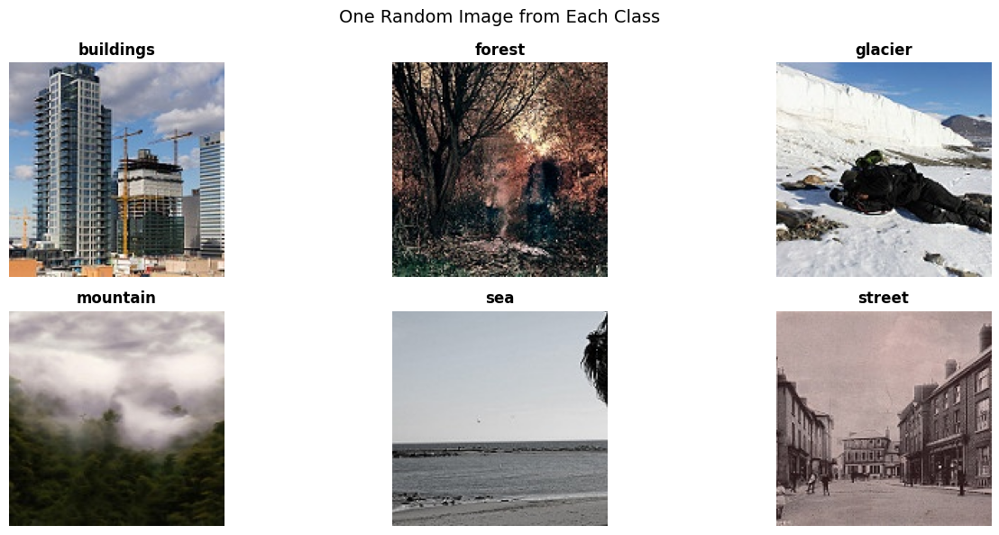

In [ ]:
# picking one random image from each class
import random
selected_images = [] # Store image paths
selected_labels = [] # Store corresponding class names

for class_name in CLASS_NAMES:
    class_path = os.path.join(TEST_DIR, class_name)
    if os.path.isdir(class_path):
        images = [img for img in os.listdir(class_path)
                  if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if images: # Ensure the class folder is not empty
            selected_img = os.path.join(class_path, random.choice(images))
            selected_images.append(selected_img)
            selected_labels.append(class_name)

# Plotting the images selected

# Determine grid size
num_classes = len(selected_images)
cols = (num_classes + 1) // 2
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(14, 6))
for i, ax in enumerate(axes.flatten()):
    if i < num_classes:
        img = mpimg.imread(selected_images[i])
        ax.imshow(img)
        ax.set_title(selected_labels[i], fontsize=12, fontweight='bold')
        ax.axis('off')
    else:
        ax.axis('off')  # Hide empty subplots

plt.suptitle('One Random Image from Each Class', fontsize=14)
plt.tight_layout()
plt.savefig('random_images.png')
plt.show()

**BAR CHART FOR CLASS DISTRIBUTION**

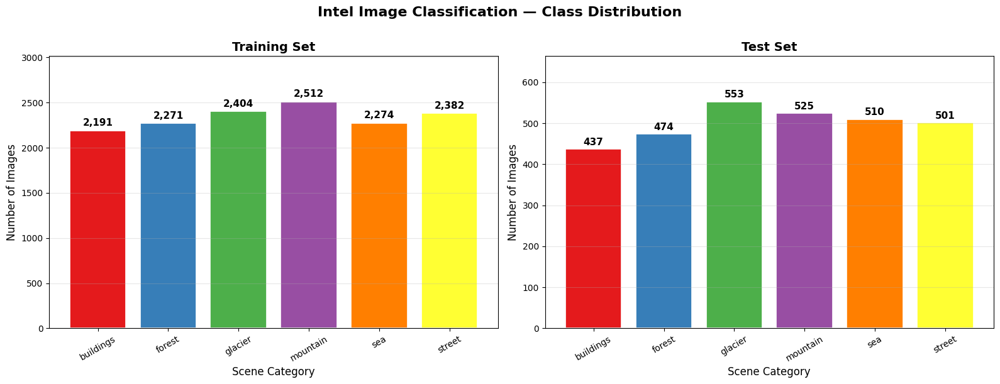

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Intel Image Classification — Class Distribution', fontsize=16, fontweight='bold', y=1.01)

# color palette
palette = sns.color_palette('Set1', NUM_CLASSES)

# Left plot: Training set distribution
bars1 = axes[0].bar(train_counts.keys(), train_counts.values(), color=palette, edgecolor='white', linewidth=1.2)
axes[0].set_title('Training Set', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Scene Category', fontsize=12)
axes[0].set_ylabel('Number of Images', fontsize=12)
axes[0].set_ylim(0, max(train_counts.values()) * 1.2)


# Add count labels on top of each bar
for bar, val in zip(bars1, train_counts.values()):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 30,
                 f'{val:,}', ha='center', va='bottom', fontsize=11, fontweight='bold')

axes[0].tick_params(axis='x', rotation=30)
axes[0].grid(axis='y', alpha=0.3)


# Right plot: Test set distribution
bars2 = axes[1].bar(test_counts.keys(), test_counts.values(), color=palette, edgecolor='white', linewidth=1.2)
axes[1].set_title('Test Set', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Scene Category', fontsize=12)
axes[1].set_ylabel('Number of Images', fontsize=12)
axes[1].set_ylim(0, max(test_counts.values()) * 1.2)


for bar, val in zip(bars2, test_counts.values()):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                 f'{val:,}', ha='center', va='bottom', fontsize=11, fontweight='bold')
axes[1].tick_params(axis='x', rotation=30)
axes[1].grid(axis='y', alpha=0.3)


plt.tight_layout()
plt.savefig('class_distribution_training_test.png', dpi=150, bbox_inches='tight')
plt.show()

The bar charts reveal that the training and test sets are well-balanced. Each category has between 2,100 and 2,500 images in the training set. This balance is ideal for training a CNN because the model will have enough examples of each scene to learn distinguishing features without being biased toward a majority class.

**RAW IMAGE PROPERTIES**

In [ ]:
sizes = []
sample_class = CLASS_NAMES[0]  # Check one class as a sample
class_dir = os.path.join(TRAIN_DIR, sample_class)
sample_files = os.listdir(class_dir)[:50]  # Check first 50 images

for fname in sample_files:
    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        fpath = os.path.join(class_dir, fname)
        with Image.open(fpath) as img:
            sizes.append(img.size)  # (width, height)

widths  = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

print("Image Size Analysis (sampled from 'buildings' class):")
print(f" Width  — min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}")
print(f" Height — min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}")

Image Size Analysis (sampled from 'buildings' class):
 Width  — min: 150, max: 150, mean: 150
 Height — min: 150, max: 150, mean: 150


Majority of the images are 150x150 pixels.
So, we will use 150×150 as our input size for Part A models.


**Data Generators with Preprocessing & Augmentation**

In [ ]:
# Global Hyperparameters
IMG_SIZE         = (150, 150)
BATCH_SIZE       = 32
EPOCHS_BASE      = 18
EPOCHS_DEEP      = 24
VALIDATION_SPLIT = 0.2
SEED             = 1337


In [ ]:
# Data augmentation for training set
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

rescale = tf.keras.layers.Rescaling(1./255)

# Training set (80%)
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    validation_split=VALIDATION_SPLIT,
    subset='training',
    seed=SEED
)

# Validation set (20%)
val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    validation_split=VALIDATION_SPLIT,
    subset='validation',
    seed=SEED
)

# Test set
test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Apply augmentation + rescaling ONLY to training set
train_ds = train_ds.map(lambda x, y: (data_augmentation(rescale(x), training=True),y))

# Only rescaling for validation and test sets
val_ds = val_ds.map(lambda x, y: (rescale(x), y))

test_ds = test_ds.map(lambda x, y: (rescale(x), y))

print("Data pipelines created successfully.")
print(f"  Training batches  : {len(train_ds)}")
print(f"  Validation batches: {len(val_ds)}")
print(f"  Test batches      : {len(test_ds)}")

for images, labels in train_ds.take(1): # Take one batch
  print("Images shape:", images.shape)
  print("Labels shape:", labels.shape)

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.
Data pipelines created successfully.
  Training batches  : 351
  Validation batches: 88
  Test batches      : 94
Images shape: (32, 150, 150, 3)
Labels shape: (32, 6)


**1.6 VISUALIZE AUGEMENTED IMAGES**

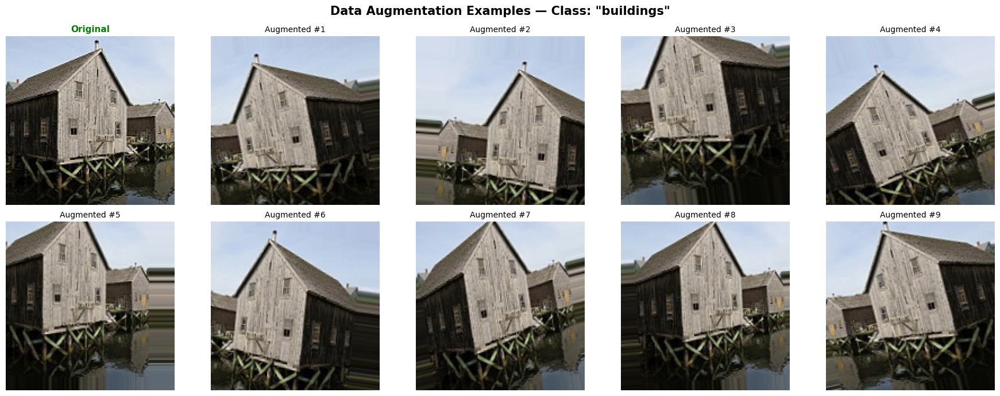

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator as IDG
# Load a single image to demonstrate augmentation effects
sample_class_aug = CLASS_NAMES[0]
sample_class_dir = os.path.join(TRAIN_DIR, sample_class_aug)
sample_image_name = os.listdir(sample_class_dir)[0]
sample_image_path = os.path.join(sample_class_dir, sample_image_name)

# Load and expand dims to match [batch, height, width, channels] format
orig_img = load_img(sample_image_path, target_size=IMG_SIZE)
orig_arr = img_to_array(orig_img)
orig_arr = np.expand_dims(orig_arr, axis=0)  # Shape: (1, 150, 150, 3)


aug_gen = IDG(
    rescale=1.0/255,
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate 8 augmented versions of the same image
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
fig.suptitle(f'Data Augmentation Examples — Class: "{sample_class_aug}"',
             fontsize=15, fontweight='bold')

# Show original image first
axes[0, 0].imshow(orig_img)
axes[0, 0].set_title('Original', fontsize=11, fontweight='bold', color='green')
axes[0, 0].axis('off')

# Show 9 augmented versions
aug_iter = aug_gen.flow(orig_arr, batch_size=1, seed=SEED)
plot_positions = [(0,1),(0,2),(0,3),(0,4),(1,0),(1,1),(1,2),(1,3),(1,4)]
for i, (r, c) in enumerate(plot_positions):
    aug_batch = next(aug_iter)
    axes[r, c].imshow(aug_batch[0])
    axes[r, c].set_title(f'Augmented #{i+1}', fontsize=10)
    axes[r, c].axis('off')

plt.tight_layout()
plt.savefig('augmentation_examples.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# UTILITY FUNCTIONS - used across all models

def plot_training_curves(history, title='Training History', color_pair=('royalblue', 'tomato')):
    """Plot loss and accuracy curves for a trained Keras model."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle(title, fontsize=15, fontweight='bold')
    epochs_ran = range(1, len(history.history['loss']) + 1)

    ax1.plot(epochs_ran, history.history['loss'],     color=color_pair[0], lw=2.5, label='Train Loss',      marker='o', ms=3)
    ax1.plot(epochs_ran, history.history['val_loss'], color=color_pair[1], lw=2.5, label='Validation Loss', linestyle='--', marker='s', ms=3)
    best_epoch = np.argmin(history.history['val_loss']) + 1
    ax1.axvline(x=best_epoch, color='gray', linestyle=':', alpha=0.7, label=f'Best Epoch: {best_epoch}')
    ax1.set_title('Loss Over Epochs', fontsize=13)
    ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
    ax1.legend(fontsize=10); ax1.grid(alpha=0.3)

    ax2.plot(epochs_ran, history.history['accuracy'],     color=color_pair[0], lw=2.5, label='Train Accuracy',      marker='o', ms=3)
    ax2.plot(epochs_ran, history.history['val_accuracy'], color=color_pair[1], lw=2.5, label='Validation Accuracy', linestyle='--', marker='s', ms=3)
    ax2.set_title('Accuracy Over Epochs', fontsize=13)
    ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy')
    ax2.set_ylim([0, 1.05])
    ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
    ax2.legend(fontsize=10); ax2.grid(alpha=0.3)

    plt.tight_layout()
    fname = title.lower().replace(' ', '_').replace('/', '').replace('—', '') + '_curves.png'
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()


In [ ]:
def evaluate_model(model, dataset, class_names, model_name='Model'):
    """
    Evaluates a Keras model on a tf.data.Dataset.
    Works with both:
    - categorical labels (one-hot)
    - sparse labels (integer encoded)
    """

    print(f"\n{'='*60}")
    print(f"EVALUATION: {model_name}")
    print(f"{'='*60}")

    #  Collect true labels
    y_true = np.concatenate([y.numpy() for _, y in dataset])

    # Convert one-hot → class indices (if needed)
    if len(y_true.shape) > 1:
        y_true = np.argmax(y_true, axis=1)

    # Predictions

    y_pred_probs = model.predict(dataset, verbose=1)
    y_pred = np.argmax(y_pred_probs, axis=1)


    # Classification Report

    print("\nClassification Report:")
    print("-" * 60)
    print(classification_report(y_true,y_pred,target_names=class_names,digits=4,zero_division=0))

    # Metrics

    acc = accuracy_score(y_true, y_pred)

    prec, rec, f1, _ = precision_recall_fscore_support(y_true,y_pred,average='weighted',zero_division=0)

    print(f"\nAccuracy : {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall   : {rec:.4f}")
    print(f"F1 Score : {f1:.4f}")


    # Confusion Matrix

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.title(f'Confusion Matrix: {model_name}', fontsize=14, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    safe_name = model_name.lower().replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(f'{safe_name}_cm.png', dpi=150, bbox_inches='tight')
    plt.show()

    return {
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1': f1
    }

In [ ]:
def predict_and_visualize(model, data_dir, class_names, n_samples=12,
                           img_size=(150, 150), model_name='Model', normalize=True):
    """Load random test images, predict their class, and visualize results."""
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.flatten()
    fig.suptitle(f'{model_name} — Sample Predictions on Test Images',
                 fontsize=14, fontweight='bold', y=1.01)

    all_images, all_labels = [], []
    for class_name in class_names:
        class_dir = os.path.join(data_dir, class_name)
        files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        selected = np.random.choice(files, size=min(2, len(files)), replace=False)
        for f in selected:
            all_images.append(os.path.join(class_dir, f))
            all_labels.append(class_name)

    indices = np.random.choice(len(all_images), n_samples, replace=False)

    for i, idx in enumerate(indices):
        img_path   = all_images[idx]
        true_label = all_labels[idx]
        img        = load_img(img_path, target_size=img_size)
        img_arr    = img_to_array(img)
        if normalize:
            img_arr = img_arr / 255.0
        img_batch  = np.expand_dims(img_arr, axis=0)

        pred_probs = model.predict(img_batch, verbose=0)
        pred_idx   = np.argmax(pred_probs)
        pred_label = class_names[pred_idx]
        confidence = pred_probs[0][pred_idx] * 100

        axes[i].imshow(img_arr if normalize else img_arr.astype('uint8') / 255.0)
        axes[i].axis('off')
        correct = pred_label == true_label
        color   = 'green' if correct else 'red'
        symbol  = '✓' if correct else '✗'
        axes[i].set_title(
            f"{symbol} True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)",
            fontsize=10, color=color, fontweight='bold'
        )

    plt.tight_layout()
    safe_name = model_name.lower().replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(f'{safe_name}_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()


---
## Task 2.5.2 — Baseline CNN Model

We build a simple CNN following the required architecture:
- **3 Convolutional layers**, each followed by a pooling layer
- **3 Fully Connected (Dense) layers**
- **1 Output layer** with softmax activation for 6-class classification

In [ ]:
def build_baseline_model(input_shape=(150, 150, 3), num_classes=6):
    """
    Build and return the baseline CNN model.

    Architecture:
      3× (Conv2D → MaxPooling2D)
      Flatten
      3× Dense
      Output Dense (softmax)
    """
    model = models.Sequential(name='Baseline_CNN')

    # Input Layer
    model.add(layers.Input(shape=input_shape))

    # First Convolutional Layer
    # 32 filters of size 3×3 learn basic features (edges, textures)
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='conv1'))
    # MaxPooling reduces 150×150 → 75×75, keeping dominant features
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))

    # Second Convolutional Layer
    # 64 filters learn mid-level features (shapes, patterns)
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'))
    # 75×75 → 37×37
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))

    # Third Convolutional Layer
    # 128 filters learn higher-level features (object parts, scene context)
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3'))
    # 37×37 → 18×18
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))

    # Flatten
    # Convert 3D feature maps (18×18×128 = 41,472 values) into 1D vector for Dense layers
    model.add(layers.Flatten(name='flatten'))

    # Fully Connected Layers
    # Dense layers combine features to make classification decisions
    model.add(layers.Dense(256, activation='relu', name='fc1'))
    model.add(layers.Dense(128, activation='relu', name='fc2'))
    model.add(layers.Dense(64, activation='relu', name='fc3'))

    # Output Layer
    # Softmax: outputs probabilities for each of the 6 classes (sum = 1.0)
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model
baseline_model = build_baseline_model(input_shape=(*IMG_SIZE, 3), num_classes=NUM_CLASSES)

In [ ]:
# Optimizer: Adam with default lr=0.001
baseline_model.compile(
    optimizer=Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
print("BASELINE CNN MODEL SUMMARY")
print("=" * 65)
baseline_model.summary()
print(f"\nTotal trainable parameters: {baseline_model.count_params():,}")

BASELINE CNN MODEL SUMMARY


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │    10,617,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,751,878 (41.02 MB)

 Trainable params: 10,751,878 (41.02 MB)

 Non-trainable params: 0 (0.00 B)


Total trainable parameters: 10,751,878


In [ ]:
# TrainING Baseline Model
callbacks_baseline = [
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_baseline_cnn_model.h5', monitor='val_accuracy', save_best_only=True, verbose=1)
]


baseline_start_time = time.time()

history_baseline = baseline_model.fit(
    train_ds,
    epochs=EPOCHS_BASE,
    validation_data=val_ds,
    callbacks=callbacks_baseline,
    verbose=1
)

baseline_train_time = time.time() - baseline_start_time

print(f"\nBaseline training complete!")
print(f"   Training time : {baseline_train_time/60:.2f} minutes")
print(f"   Epochs run    : {len(history_baseline.history['loss'])}")

Epoch 1/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.4779 - loss: 1.3160
Epoch 1: val_accuracy improved from None to 0.42267, saving model to best_baseline_cnn_model.h5



Epoch 1: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 82s 214ms/step - accuracy: 0.5563 - loss: 1.1281 - val_accuracy: 0.4227 - val_loss: 1.7676
Epoch 2/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.6574 - loss: 0.9154
Epoch 2: val_accuracy improved from 0.42267 to 0.64291, saving model to best_baseline_cnn_model.h5



Epoch 2: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 66s 189ms/step - accuracy: 0.6749 - loss: 0.8667 - val_accuracy: 0.6429 - val_loss: 0.9255
Epoch 3/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.7261 - loss: 0.7621
Epoch 3: val_accuracy improved from 0.64291 to 0.83535, saving model to best_baseline_cnn_model.h5



Epoch 3: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.7386 - loss: 0.7298 - val_accuracy: 0.8354 - val_loss: 0.4625
Epoch 4/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.7481 - loss: 0.6863
Epoch 4: val_accuracy did not improve from 0.83535
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 183ms/step - accuracy: 0.7533 - loss: 0.6708 - val_accuracy: 0.7823 - val_loss: 0.5720
Epoch 5/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.7697 - loss: 0.6345
Epoch 5: val_accuracy did not improve from 0.83535
351/351 ━━━━━━━━━━━━━━━━━━━━ 63s 179ms/step - accuracy: 0.7743 - loss: 0.6168 - val_accuracy: 0.8275 - val_loss: 0.4712
Epoch 6/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.7813 - loss: 0.6023
Epoch 6: val_accuracy did not improve from 0.83535
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.7883 - loss: 0.5822 - val_accuracy: 0.8247 - val_loss: 0.4966
Epoch 7/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0


Epoch 7: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 82s 185ms/step - accuracy: 0.8050 - loss: 0.5413 - val_accuracy: 0.8514 - val_loss: 0.3982
Epoch 8/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8123 - loss: 0.5216
Epoch 8: val_accuracy improved from 0.85139 to 0.88703, saving model to best_baseline_cnn_model.h5



Epoch 8: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 67s 190ms/step - accuracy: 0.8193 - loss: 0.5043 - val_accuracy: 0.8870 - val_loss: 0.3390
Epoch 9/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8250 - loss: 0.4874
Epoch 9: val_accuracy did not improve from 0.88703
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 184ms/step - accuracy: 0.8221 - loss: 0.4907 - val_accuracy: 0.8803 - val_loss: 0.3605
Epoch 10/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8226 - loss: 0.4859
Epoch 10: val_accuracy did not improve from 0.88703
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 184ms/step - accuracy: 0.8335 - loss: 0.4633 - val_accuracy: 0.8585 - val_loss: 0.4135
Epoch 11/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.8272 - loss: 0.4673
Epoch 11: val_accuracy improved from 0.88703 to 0.91768, saving model to best_baseline_cnn_model.h5



Epoch 11: finished saving model to best_baseline_cnn_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.8320 - loss: 0.4587 - val_accuracy: 0.9177 - val_loss: 0.2453
Epoch 12/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.8440 - loss: 0.4421
Epoch 12: val_accuracy did not improve from 0.91768
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 182ms/step - accuracy: 0.8485 - loss: 0.4257 - val_accuracy: 0.8321 - val_loss: 0.4493
Epoch 13/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.8542 - loss: 0.4170
Epoch 13: val_accuracy did not improve from 0.91768
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.8558 - loss: 0.4029 - val_accuracy: 0.9138 - val_loss: 0.2609
Epoch 14/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.8521 - loss: 0.4070
Epoch 14: val_accuracy did not improve from 0.91768
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 193ms/step - accuracy: 0.8568 - loss: 0.3907 - val_accuracy: 0.8888 - val_loss: 0.3031
Epoch 15/18
351/351 ━━━━━━━━━━━━━━

In [ ]:
# evaluation on the unseen Test Set
test_loss, test_acc = baseline_model.evaluate(test_ds, verbose=0)
print(f"\n[Baseline Test Result] Loss: {test_loss:.4f}, Accuracy: {test_acc*100:.2f}%")


[Baseline Test Result] Loss: 0.5298, Accuracy: 82.87%


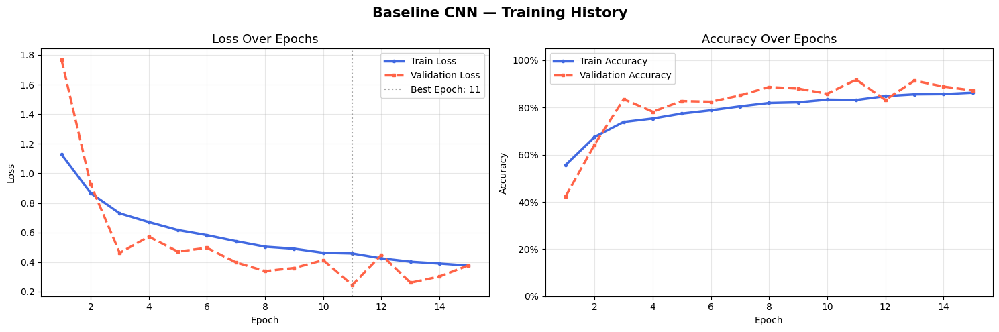

In [ ]:
plot_training_curves(history_baseline, title='Baseline CNN — Training History')


EVALUATION: Baseline CNN
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.8019    0.7872    0.7945       437
      forest     0.9638    0.9557    0.9597       474
     glacier     0.8178    0.7468    0.7807       553
    mountain     0.7725    0.7695    0.7710       525
         sea     0.8268    0.8235    0.8251       510
      street     0.8000    0.9022    0.8480       501

    accuracy                         0.8287      3000
   macro avg     0.8305    0.8308    0.8298      3000
weighted avg     0.8292    0.8287    0.8281      3000


Accuracy : 0.8287
Precision: 0.8292
Recall   : 0.8287
F1 Score : 0.8281


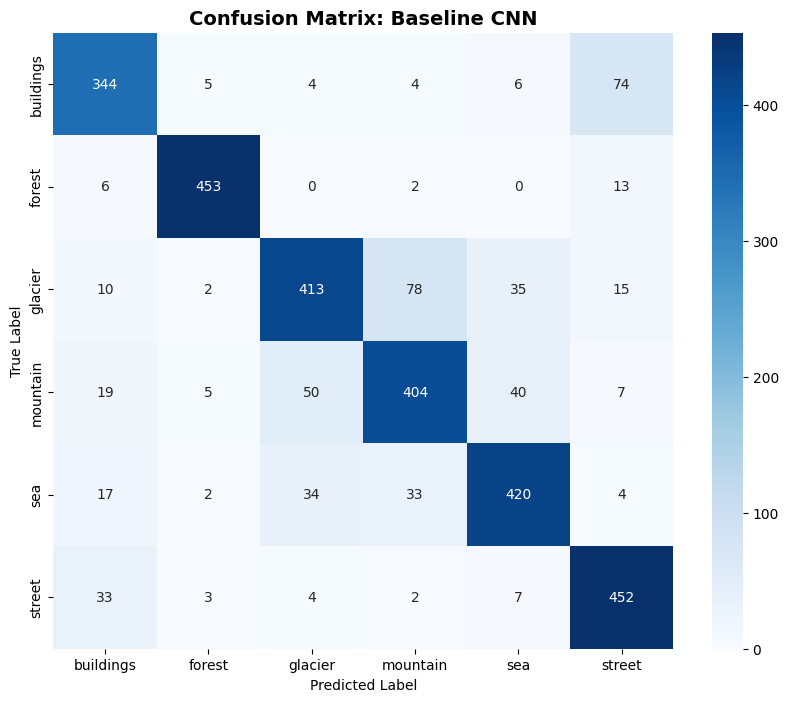

In [ ]:
# Evaluate baseline
baseline_metrics = evaluate_model(baseline_model, test_ds, CLASS_NAMES, "Baseline CNN")

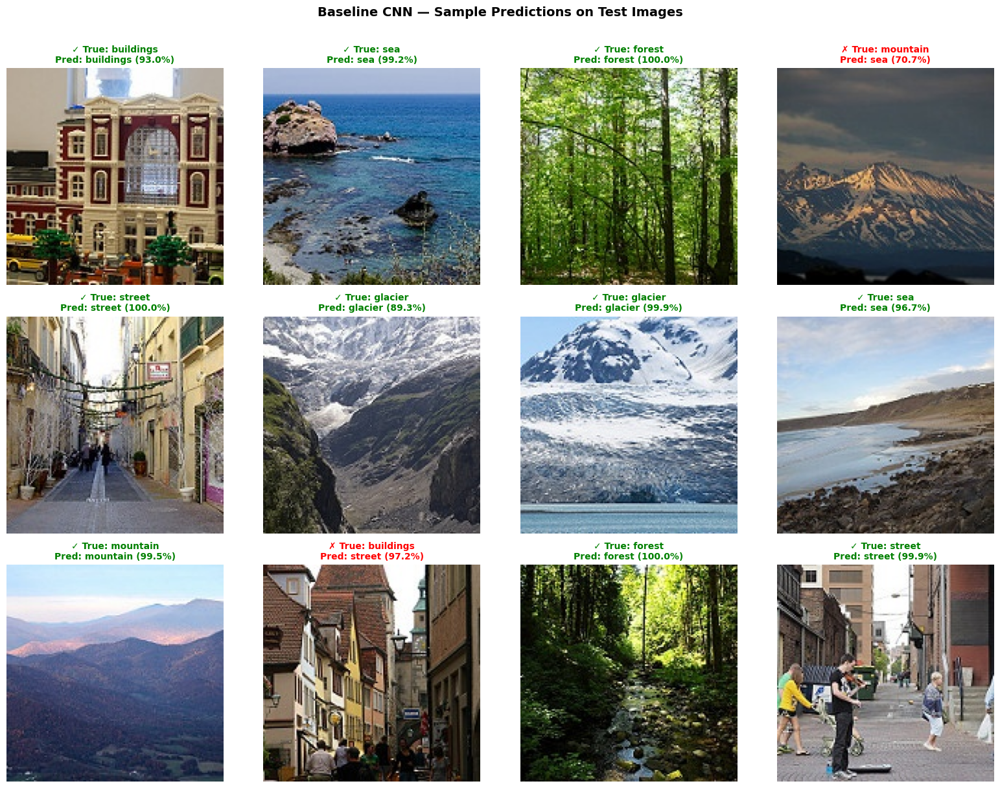

In [ ]:
predict_and_visualize(
    baseline_model, TEST_DIR, CLASS_NAMES,
    n_samples=12, img_size=IMG_SIZE, model_name='Baseline CNN'
)

# DEEPER MODEL

In [ ]:
def build_deeper_model(input_shape=(150, 150, 3), num_classes=6):
    """
    Build a deeper CNN with batch normalization and dropout regularization.
    6 convolutional blocks + 3 dense layers (double the baseline depth).
    """
    model = models.Sequential(name='Deeper_CNN_with_Regularization')
    model.add(layers.Input(shape=input_shape))

    # Block 1: 32 filters
    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_1'))
    model.add(layers.BatchNormalization(name='bn1_1'))  # Normalize activations
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_2'))
    model.add(layers.BatchNormalization(name='bn1_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool1'))  # 150 → 75
    model.add(layers.Dropout(0.2, name='drop1'))

    # Block 2: 64 filters
    model.add(layers.Conv2D(64, (3,3), padding='same',name='conv2_1'))
    model.add(layers.BatchNormalization(name='bn2_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3,3), padding='same', name='conv2_2'))
    model.add(layers.BatchNormalization(name='bn2_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool2'))  # 75 → 37
    model.add(layers.Dropout(0.2, name='drop2'))

    # Block 3: 128 filters
    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_1'))
    model.add(layers.BatchNormalization(name='bn3_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_2'))
    model.add(layers.BatchNormalization(name='bn3_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool3'))  # 37 → 18
    model.add(layers.Dropout(0.2, name='drop3'))

    # Flatten + Dense Layers with Dropout
    model.add(layers.Flatten(name='flatten'))

    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.5, name='dropout1'))

    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.4, name='dropout2'))

    model.add(layers.Dense(128, name='fc3'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.3, name='dropout3'))

    # ── Output Layer ──
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model

# Build the deeper model
deeper_model = build_deeper_model(input_shape=(*IMG_SIZE, 3), num_classes=NUM_CLASSES)

In [ ]:
deeper_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [ ]:
print("DEEPER CNN MODEL SUMMARY")
print("=" * 65)
deeper_model.summary()
print(f"\nTotal trainable parameters: {deeper_model.count_params():,}")
print(f"Baseline parameters       : {baseline_model.count_params():,}")
ratio = deeper_model.count_params() / baseline_model.count_params()
print(f"Parameter ratio (Deeper/Baseline): {ratio:.2f}×")

DEEPER CNN MODEL SUMMARY


Model: "Deeper_CNN_with_Regularization"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_1 (BatchNormalization)      │ (None, 150, 150, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_2 (Conv2D)                │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_2 (BatchNormalization)      │ (None, 150, 150, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_1 (BatchNormalization)      │ (None, 75, 75, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_2 (Conv2D)                │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_2 (BatchNormalization)      │ (None, 75, 75, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_12 (Activation)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_1 (BatchNormalization)      │ (None, 37, 37, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_13 (Activation)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_2 (Conv2D)                │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_2 (BatchNormalization)      │ (None, 37, 37, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_14 (Activation)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop3 (Dropout)                 │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             

 Total params: 21,690,022 (82.74 MB)

 Trainable params: 21,688,102 (82.73 MB)

 Non-trainable params: 1,920 (7.50 KB)


Total trainable parameters: 21,690,022
Baseline parameters       : 10,751,878
Parameter ratio (Deeper/Baseline): 2.02×


In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint('best_deeper_model.h5', monitor='val_accuracy', save_best_only=True, verbose=1)

In [ ]:
print("Starting Deeper CNN Training...")
print("-" * 55)
deeper_start_time = time.time()

history_deeper = deeper_model.fit(
    train_ds,
    epochs=EPOCHS_DEEP,
    validation_data=val_ds,
    callbacks=[early_stop, model_checkpoint],
    verbose=1
)

deeper_train_time = time.time() - deeper_start_time

print(f"\n Deeper model training complete!")
print(f"   Training time : {deeper_train_time/60:.2f} minutes")
print(f"   Epochs run    : {len(history_deeper.history['loss'])}")

Starting Deeper CNN Training...
-------------------------------------------------------
Epoch 1/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.5756 - loss: 1.1024
Epoch 1: val_accuracy improved from None to 0.30043, saving model to best_deeper_model.h5



Epoch 1: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 85s 243ms/step - accuracy: 0.6093 - loss: 1.0370 - val_accuracy: 0.3004 - val_loss: 2.1314
Epoch 2/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.6831 - loss: 0.8876
Epoch 2: val_accuracy improved from 0.30043 to 0.66999, saving model to best_deeper_model.h5



Epoch 2: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 217ms/step - accuracy: 0.6922 - loss: 0.8649 - val_accuracy: 0.6700 - val_loss: 0.7725
Epoch 3/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.7101 - loss: 0.8009
Epoch 3: val_accuracy did not improve from 0.66999
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 205ms/step - accuracy: 0.7195 - loss: 0.7802 - val_accuracy: 0.4212 - val_loss: 1.5083
Epoch 4/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.7383 - loss: 0.7462
Epoch 4: val_accuracy improved from 0.66999 to 0.68532, saving model to best_deeper_model.h5



Epoch 4: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7436 - loss: 0.7293 - val_accuracy: 0.6853 - val_loss: 0.7848
Epoch 5/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.7512 - loss: 0.6902
Epoch 5: val_accuracy did not improve from 0.68532
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.7606 - loss: 0.6753 - val_accuracy: 0.2188 - val_loss: 2.1411
Epoch 6/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.7718 - loss: 0.6569
Epoch 6: val_accuracy improved from 0.68532 to 0.72238, saving model to best_deeper_model.h5



Epoch 6: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 213ms/step - accuracy: 0.7741 - loss: 0.6395 - val_accuracy: 0.7224 - val_loss: 0.8199
Epoch 7/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.7797 - loss: 0.6146
Epoch 7: val_accuracy did not improve from 0.72238
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 203ms/step - accuracy: 0.7814 - loss: 0.6198 - val_accuracy: 0.6115 - val_loss: 1.0499
Epoch 8/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7866 - loss: 0.6077
Epoch 8: val_accuracy improved from 0.72238 to 0.77619, saving model to best_deeper_model.h5



Epoch 8: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 203ms/step - accuracy: 0.7911 - loss: 0.5976 - val_accuracy: 0.7762 - val_loss: 0.6865
Epoch 9/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.8021 - loss: 0.5732
Epoch 9: val_accuracy did not improve from 0.77619
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.8031 - loss: 0.5666 - val_accuracy: 0.6351 - val_loss: 1.0938
Epoch 10/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.8094 - loss: 0.5601
Epoch 10: val_accuracy did not improve from 0.77619
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8073 - loss: 0.5632 - val_accuracy: 0.4619 - val_loss: 1.6823
Epoch 11/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.8125 - loss: 0.5447
Epoch 11: val_accuracy did not improve from 0.77619
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.8118 - loss: 0.5368 - val_accuracy: 0.4601 - val_loss: 1.9523
Epoch 12/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s


Epoch 16: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 220ms/step - accuracy: 0.8412 - loss: 0.4727 - val_accuracy: 0.8143 - val_loss: 0.4388
Epoch 17/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.8437 - loss: 0.4679
Epoch 17: val_accuracy did not improve from 0.81433
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 206ms/step - accuracy: 0.8393 - loss: 0.4657 - val_accuracy: 0.3553 - val_loss: 2.0193
Epoch 18/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.8430 - loss: 0.4604
Epoch 18: val_accuracy did not improve from 0.81433
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 209ms/step - accuracy: 0.8455 - loss: 0.4473 - val_accuracy: 0.7277 - val_loss: 0.7778
Epoch 19/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.8494 - loss: 0.4580
Epoch 19: val_accuracy did not improve from 0.81433
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.8468 - loss: 0.4549 - val_accuracy: 0.4950 - val_loss: 1.3288
Epoch 20/24
351/351 ━━━━━━━━━━━━━━━━━━━━


Epoch 22: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 217ms/step - accuracy: 0.8545 - loss: 0.4148 - val_accuracy: 0.8272 - val_loss: 0.4257
Epoch 23/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.8670 - loss: 0.3936
Epoch 23: val_accuracy improved from 0.82716 to 0.83072, saving model to best_deeper_model.h5



Epoch 23: finished saving model to best_deeper_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 212ms/step - accuracy: 0.8670 - loss: 0.3992 - val_accuracy: 0.8307 - val_loss: 0.4606
Epoch 24/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.8663 - loss: 0.3986
Epoch 24: val_accuracy did not improve from 0.83072
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.8649 - loss: 0.4009 - val_accuracy: 0.4594 - val_loss: 1.5282
Restoring model weights from the end of the best epoch: 22.

 Deeper model training complete!
   Training time : 29.74 minutes
   Epochs run    : 24


In [ ]:
# Final evaluation on the unseen Test Set
test_loss, test_acc = deeper_model.evaluate(test_ds, verbose=0)
print(f"\n[Deeper Test Result] Loss: {test_loss:.4f}, Accuracy: {test_acc*100:.2f}%")


[Deeper Test Result] Loss: 0.5321, Accuracy: 83.33%


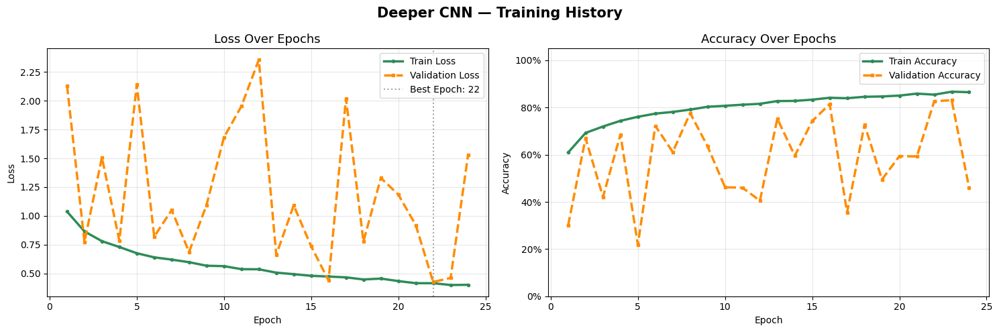

In [ ]:
plot_training_curves(history_deeper, title='Deeper CNN — Training History',
                     color_pair=('seagreen', 'darkorange'))


EVALUATION: Deeper CNN
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.6672    0.9268    0.7759       437
      forest     0.9471    0.9451    0.9461       474
     glacier     0.8271    0.7957    0.8111       553
    mountain     0.8246    0.7524    0.7869       525
         sea     0.8753    0.7843    0.8273       510
      street     0.9115    0.8224    0.8646       501

    accuracy                         0.8333      3000
   macro avg     0.8421    0.8378    0.8353      3000
weighted avg     0.8446    0.8333    0.8347      3000


Accuracy : 0.8333
Precision: 0.8446
Recall   : 0.8333
F1 Score : 0.8347


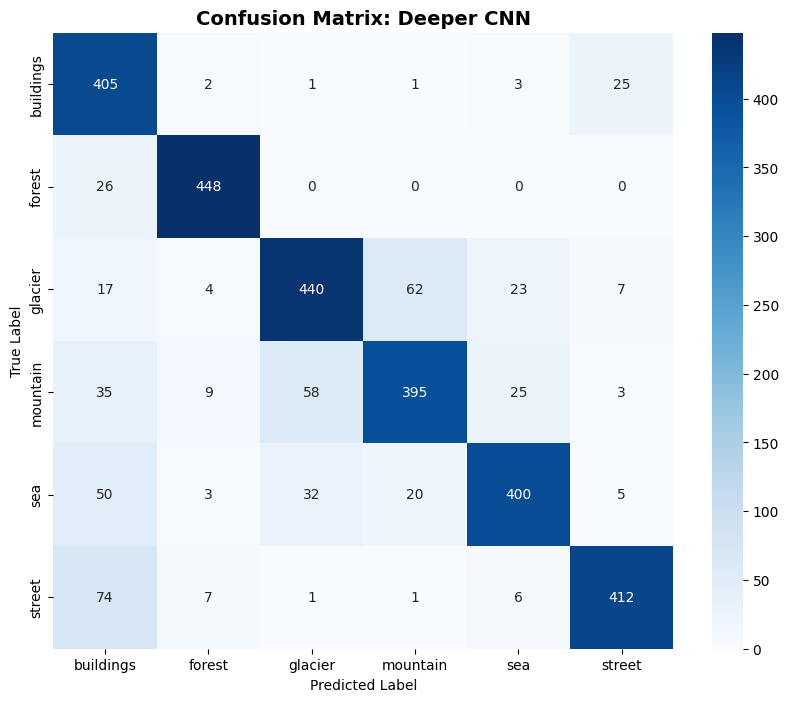

In [ ]:
metrics_deeper= evaluate_model(
    deeper_model, test_ds, CLASS_NAMES, model_name='Deeper CNN')

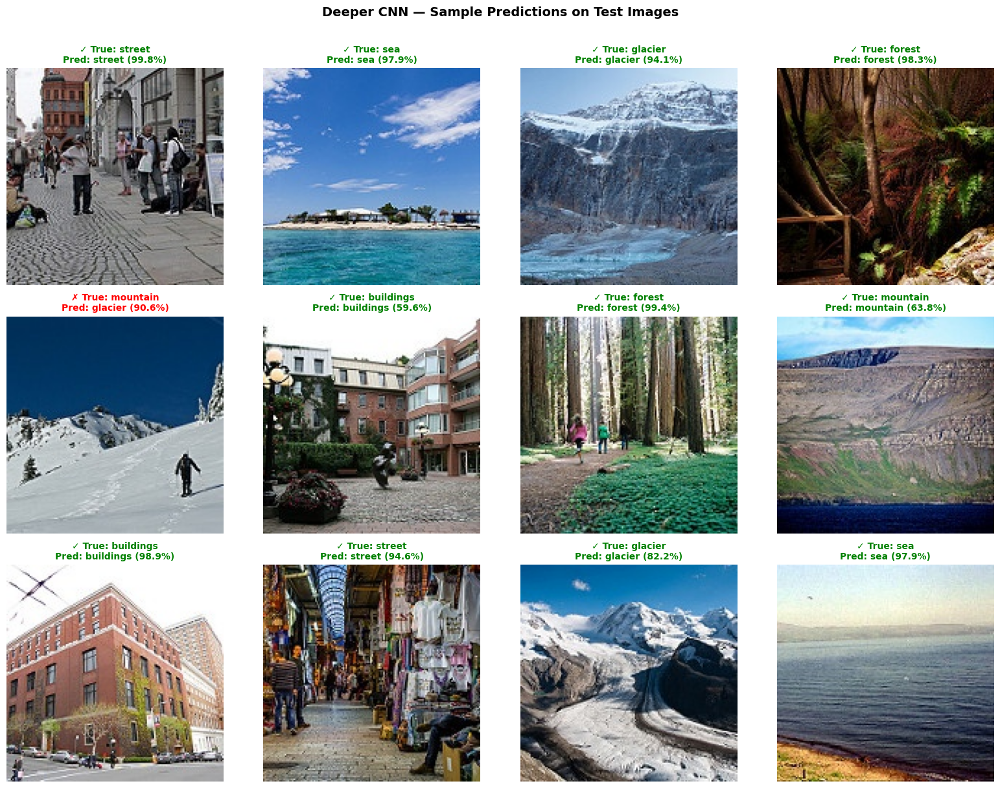

In [ ]:
predict_and_visualize(
    deeper_model, TEST_DIR, CLASS_NAMES,
    n_samples=12, img_size=IMG_SIZE, model_name='Deeper CNN')

---
## Task 2.5.4 — Experimentation and Comparative Analysis

This section performs four key experiments to deepen our understanding of the models' behavior and trade-offs.

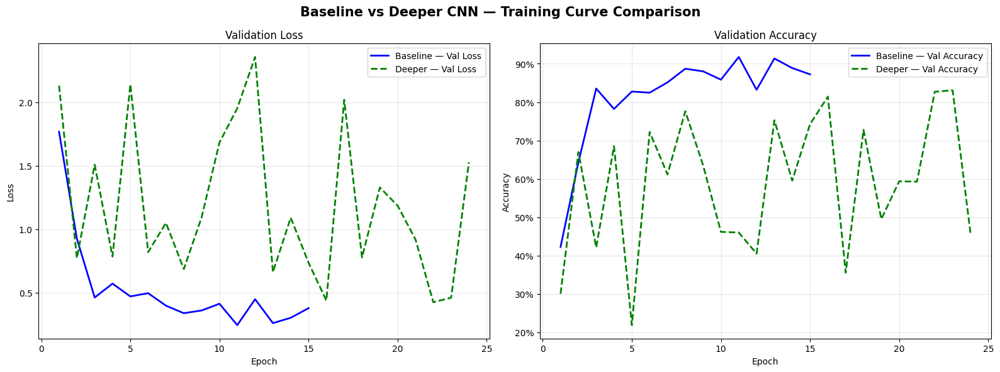

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Baseline vs Deeper CNN — Training Curve Comparison', fontsize=15, fontweight='bold')

e_base = range(1, len(history_baseline.history['loss']) + 1)
e_deep = range(1, len(history_deeper.history['loss']) + 1)

axes[0].plot(e_base, history_baseline.history['val_loss'], 'b-',  lw=2, label='Baseline — Val Loss')
axes[0].plot(e_deep, history_deeper.history['val_loss'],   'g--', lw=2, label='Deeper — Val Loss')
axes[0].set_title('Validation Loss'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(e_base, history_baseline.history['val_accuracy'], 'b-',  lw=2, label='Baseline — Val Accuracy')
axes[1].plot(e_deep, history_deeper.history['val_accuracy'],   'g--', lw=2, label='Deeper — Val Accuracy')
axes[1].set_title('Validation Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('baseline_vs_deeper_curves.png', dpi=150, bbox_inches='tight')
plt.show()



In [ ]:
print("\nPerformance Metrics Comparison:")
print("-" * 60)
print(f"{'Metric':<15} {'Baseline':>15} {'Deeper':>15} {'Improvement':>15}")
print("-" * 60)
for metric in ['accuracy', 'precision', 'recall', 'f1']:
    b_val = baseline_metrics[metric]
    d_val = metrics_deeper[metric]
    diff  = d_val - b_val
    arrow = '↑' if diff > 0 else '↓'
    print(f"{metric.capitalize():<15} {b_val:>15.4f} {d_val:>15.4f} {arrow} {abs(diff):>12.4f}")
print("-" * 60)
print(f"{'Train Time':<15} {baseline_train_time/60:>14.2f}m {deeper_train_time/60:>14.2f}m")
print(f"{'Parameters':<15} {baseline_model.count_params():>15,} {deeper_model.count_params():>15,}")


Performance Metrics Comparison:
------------------------------------------------------------
Metric                 Baseline          Deeper     Improvement
------------------------------------------------------------
Accuracy                 0.8287          0.8333 ↑       0.0047
Precision                0.8292          0.8446 ↑       0.0155
Recall                   0.8287          0.8333 ↑       0.0047
F1                       0.8281          0.8347 ↑       0.0067
------------------------------------------------------------
Train Time               17.20m          29.74m
Parameters           10,751,878      21,690,022


In [ ]:
def train_with_optimizer(optimizer, optimizer_name, epochs=EPOCHS_DEEP):
    """Build a fresh deeper model, train it with a given optimizer, return history."""
    print(f"\n Training Deeper CNN with {optimizer_name} optimizer...")
    model = build_deeper_model(input_shape=(*IMG_SIZE, 3), num_classes=NUM_CLASSES)
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    start = time.time()
    history = model.fit(train_ds,epochs=epochs,validation_data=val_ds,
        callbacks=[early_stop, ModelCheckpoint('best_deeper_model_sgd.h5',monitor='val_accuracy', save_best_only=True, verbose=1)],
        verbose=1
    )
    time_taken = time.time() - start

    print(f"\n Deeper model with {optimizer_name} training complete!")
    print(f"   Training time : {time_taken/60:.2f} minutes")
    print(f"   Epochs run    : {len(history.history['loss'])}")
    return model, history, time_taken


In [ ]:
# Train with SGD (with momentum — standard good configuration)
model_sgd, hist_sgd, time_sgd = train_with_optimizer(
    SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    optimizer_name='SGD (lr=0.01, momentum=0.9)'
)


 Training Deeper CNN with SGD (lr=0.01, momentum=0.9) optimizer...
Epoch 1/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.4411 - loss: 1.4276
Epoch 1: val_accuracy improved from None to 0.62616, saving model to best_deeper_model_sgd.h5



Epoch 1: finished saving model to best_deeper_model_sgd.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 96s 236ms/step - accuracy: 0.5268 - loss: 1.2104 - val_accuracy: 0.6262 - val_loss: 1.0918
Epoch 2/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.6135 - loss: 1.0001
Epoch 2: val_accuracy improved from 0.62616 to 0.65681, saving model to best_deeper_model_sgd.h5



Epoch 2: finished saving model to best_deeper_model_sgd.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 128s 216ms/step - accuracy: 0.6362 - loss: 0.9676 - val_accuracy: 0.6568 - val_loss: 0.8648
Epoch 3/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.6750 - loss: 0.8986
Epoch 3: val_accuracy improved from 0.65681 to 0.86850, saving model to best_deeper_model_sgd.h5



Epoch 3: finished saving model to best_deeper_model_sgd.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.6871 - loss: 0.8692 - val_accuracy: 0.8685 - val_loss: 0.4391
Epoch 4/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7067 - loss: 0.8128
Epoch 4: val_accuracy did not improve from 0.86850
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 210ms/step - accuracy: 0.7146 - loss: 0.7976 - val_accuracy: 0.6411 - val_loss: 1.0116
Epoch 5/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.7275 - loss: 0.7823
Epoch 5: val_accuracy did not improve from 0.86850
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.7333 - loss: 0.7481 - val_accuracy: 0.6981 - val_loss: 0.8610
Epoch 6/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.7404 - loss: 0.7364
Epoch 6: val_accuracy did not improve from 0.86850
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.7496 - loss: 0.7116 - val_accuracy: 0.8528 - val_loss: 0.3974
Epoch 7/24
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [ ]:
# Final evaluation on the unseen Test Set
test_loss, test_acc = model_sgd.evaluate(test_ds, verbose=0)
print(f"\n[Deeper with SGD Test Result] Loss: {test_loss:.4f}, Accuracy: {test_acc*100:.2f}%")


[Deeper with SGD Test Result] Loss: 0.6026, Accuracy: 78.27%


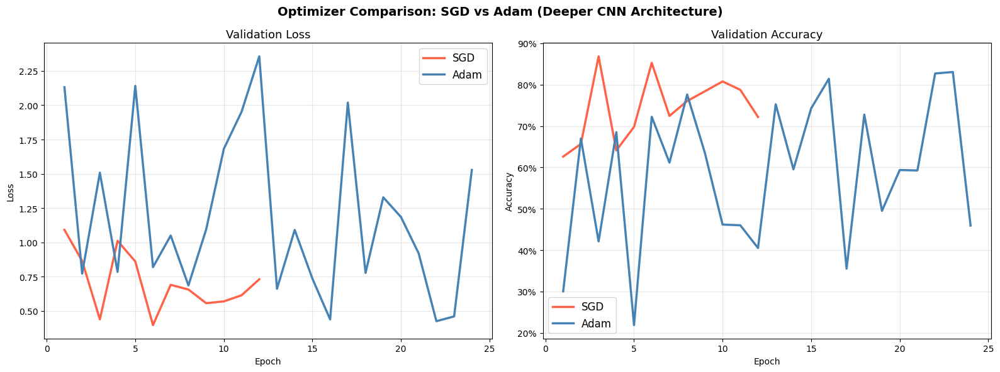

In [ ]:
# SGD vs Adam comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Optimizer Comparison: SGD vs Adam (Deeper CNN Architecture)',
             fontsize=14, fontweight='bold')

e_sgd  = range(1, len(hist_sgd.history['val_loss']) + 1)
e_adam = range(1, len(history_deeper.history['val_loss']) + 1)

# Validation Loss
axes[0].plot(e_sgd,  hist_sgd.history['val_loss'],  'tomato',  linewidth=2.5, label='SGD')
axes[0].plot(e_adam, history_deeper.history['val_loss'],  'steelblue', linewidth=2.5, label='Adam')
axes[0].set_title('Validation Loss', fontsize=13)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(fontsize=12)
axes[0].grid(alpha=0.3)

# Validation Accuracy
axes[1].plot(e_sgd,  hist_sgd.history['val_accuracy'],  'tomato',  linewidth=2.5, label='SGD')
axes[1].plot(e_adam, history_deeper.history['val_accuracy'],  'steelblue', linewidth=2.5, label='Adam')
axes[1].set_title('Validation Accuracy', fontsize=13)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
axes[1].legend(fontsize=12)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('optimizer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()



EVALUATION: Deeper CNN (SGD)
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.6998    0.7895    0.7419       437
      forest     0.9810    0.8692    0.9217       474
     glacier     0.8252    0.6745    0.7423       553
    mountain     0.7934    0.6876    0.7367       525
         sea     0.7083    0.8333    0.7658       510
      street     0.7448    0.8623    0.7993       501

    accuracy                         0.7827      3000
   macro avg     0.7921    0.7861    0.7846      3000
weighted avg     0.7927    0.7827    0.7831      3000


Accuracy : 0.7827
Precision: 0.7927
Recall   : 0.7827
F1 Score : 0.7831


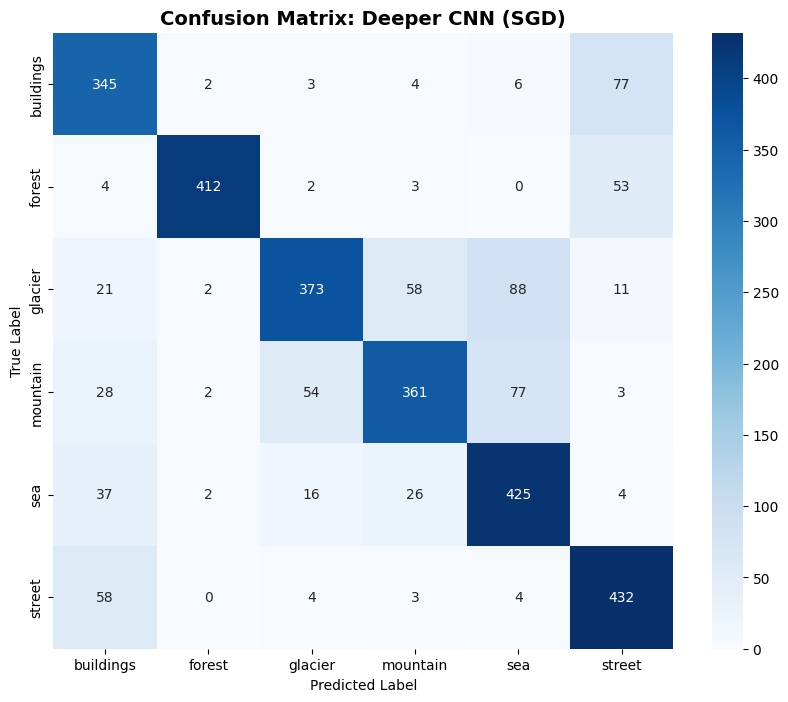

In [ ]:
# Evaluate both
metrics_sgd  = evaluate_model(model_sgd,  test_ds, CLASS_NAMES, 'Deeper CNN (SGD)')

In [ ]:
print("\nOptimizer Summary:")
print(f"{'Metric':<15} {'SGD':>15} {'Adam':>15}")
print("-" * 45)
for m in ['accuracy', 'f1']:
    print(f"{m.capitalize():<15} {metrics_sgd[m]:>15.4f} {metrics_deeper[m]:>15.4f}")
print(f"{'Train Time':<15} {time_sgd/60:>14.2f}m {deeper_train_time/60:>14.2f}m")


Optimizer Summary:
Metric                      SGD            Adam
---------------------------------------------
Accuracy                 0.7827          0.8333
F1                       0.7831          0.8347
Train Time               16.26m          29.74m


In [ ]:
# Ablation Study: Remove Dropout

def build_deeper_no_dropout(input_shape=(150, 150, 3), num_classes=6):

    model = models.Sequential(name='Deeper_CNN_No_Dropout')
    model.add(layers.Input(shape=input_shape))

    # Block 1: 32 filters
    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_1'))
    model.add(layers.BatchNormalization(name='bn1_1'))  # Normalize activations
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_2'))
    model.add(layers.BatchNormalization(name='bn1_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool1'))  # 150 → 75


    # Block 2: 64 filters
    model.add(layers.Conv2D(64, (3,3), padding='same',name='conv2_1'))
    model.add(layers.BatchNormalization(name='bn2_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3,3), padding='same', name='conv2_2'))
    model.add(layers.BatchNormalization(name='bn2_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool2'))  # 75 → 37

    # Block 3: 128 filters
    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_1'))
    model.add(layers.BatchNormalization(name='bn3_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_2'))
    model.add(layers.BatchNormalization(name='bn3_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool3'))  # 37 → 18


    # Flatten + Dense Layers with Dropout
    model.add(layers.Flatten(name='flatten'))

    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu'))


    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.Activation('relu'))


    model.add(layers.Dense(128, name='fc3'))
    model.add(layers.Activation('relu'))


    # ── Output Layer ──
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


model_no_dropout = build_deeper_no_dropout(input_shape=(*IMG_SIZE, 3), num_classes=NUM_CLASSES)

In [ ]:
model_no_dropout.compile(
    optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy']
)
checkpoint_nd = ModelCheckpoint(
    filepath  = 'best_nodrop_model.h5',
    monitor = 'val_accuracy',
    save_best_only = True,
    verbose  = 1
)

early_stop_nd = EarlyStopping(
    monitor = 'val_loss',
    patience = 5,
    restore_best_weights = True,
    verbose = 1
)
print("Ablation Study: Deeper CNN WITHOUT Dropout...")
nd_start = time.time()
hist_no_dropout = model_no_dropout.fit(
    train_ds, epochs=16,
    validation_data=val_ds,
    callbacks  = [checkpoint_nd, early_stop_nd],
    verbose=1
)
time_no_dropout = time.time() - nd_start

Ablation Study: Deeper CNN WITHOUT Dropout...
Epoch 1/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.5808 - loss: 1.1005
Epoch 1: val_accuracy improved from None to 0.66108, saving model to best_nodrop_model.h5



Epoch 1: finished saving model to best_nodrop_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 92s 234ms/step - accuracy: 0.6354 - loss: 0.9660 - val_accuracy: 0.6611 - val_loss: 0.8612
Epoch 2/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.7049 - loss: 0.8041
Epoch 2: val_accuracy improved from 0.66108 to 0.66536, saving model to best_nodrop_model.h5



Epoch 2: finished saving model to best_nodrop_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 86s 245ms/step - accuracy: 0.7178 - loss: 0.7676 - val_accuracy: 0.6654 - val_loss: 0.8395
Epoch 3/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.7535 - loss: 0.6861
Epoch 3: val_accuracy improved from 0.66536 to 0.74234, saving model to best_nodrop_model.h5



Epoch 3: finished saving model to best_nodrop_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7606 - loss: 0.6617 - val_accuracy: 0.7423 - val_loss: 0.6590
Epoch 4/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.7753 - loss: 0.6240
Epoch 4: val_accuracy did not improve from 0.74234
351/351 ━━━━━━━━━━━━━━━━━━━━ 84s 238ms/step - accuracy: 0.7792 - loss: 0.6076 - val_accuracy: 0.4986 - val_loss: 1.5815
Epoch 5/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7886 - loss: 0.5856
Epoch 5: val_accuracy did not improve from 0.74234
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 210ms/step - accuracy: 0.7989 - loss: 0.5580 - val_accuracy: 0.6971 - val_loss: 0.7815
Epoch 6/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.8123 - loss: 0.5338
Epoch 6: val_accuracy improved from 0.74234 to 0.79045, saving model to best_nodrop_model.h5



Epoch 6: finished saving model to best_nodrop_model.h5
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 210ms/step - accuracy: 0.8160 - loss: 0.5184 - val_accuracy: 0.7904 - val_loss: 0.5424
Epoch 7/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8146 - loss: 0.5098
Epoch 7: val_accuracy did not improve from 0.79045
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 221ms/step - accuracy: 0.8206 - loss: 0.4948 - val_accuracy: 0.3696 - val_loss: 1.7911
Epoch 8/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8259 - loss: 0.4900
Epoch 8: val_accuracy did not improve from 0.79045
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 217ms/step - accuracy: 0.8320 - loss: 0.4710 - val_accuracy: 0.6932 - val_loss: 0.7874
Epoch 9/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.8323 - loss: 0.4708
Epoch 9: val_accuracy did not improve from 0.79045
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 214ms/step - accuracy: 0.8359 - loss: 0.4564 - val_accuracy: 0.6825 - val_loss: 0.7537
Epoch 10/16
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 219

In [ ]:
# Final evaluation on the unseen Test Set
nd_test_loss, nd_test_acc = model_no_dropout.evaluate(test_ds, verbose=0)
print(f"\n[Deeper with no dropout Test Result] Loss: {nd_test_loss:.4f}, Accuracy: {nd_test_acc*100:.2f}%")


[Deeper with no dropout Test Result] Loss: 0.8958, Accuracy: 69.77%


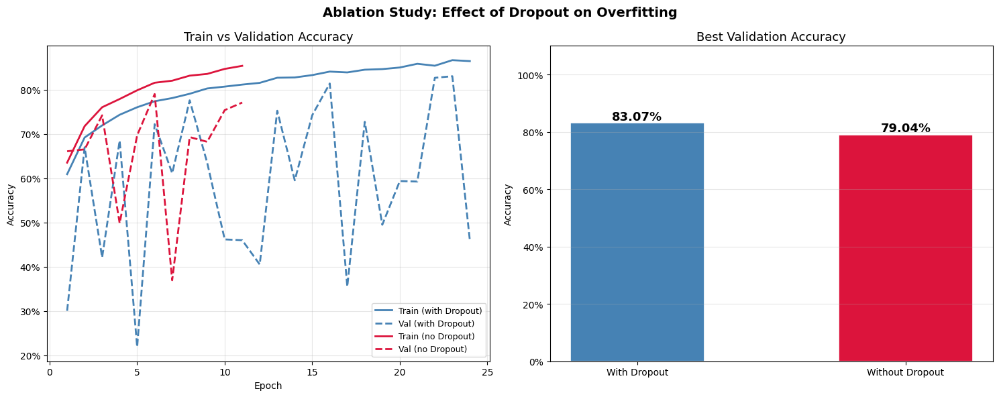


 Ablation Insight:
   With dropout   : train-val gap should be SMALLER (less overfitting)
   Without dropout: train-val gap should be LARGER (more overfitting)


In [ ]:
# Compare with vs without dropout
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Ablation Study: Effect of Dropout on Overfitting', fontsize=14, fontweight='bold')

e_drop   = range(1, len(history_deeper.history['val_accuracy']) + 1)
e_nodrop = range(1, len(hist_no_dropout.history['val_accuracy']) + 1)

# Training vs Validation accuracy — with dropout
axes[0].plot(e_drop, history_deeper.history['accuracy'],     'steelblue', linewidth=2, label='Train (with Dropout)')
axes[0].plot(e_drop, history_deeper.history['val_accuracy'], 'steelblue', linewidth=2, linestyle='--', label='Val (with Dropout)')
axes[0].plot(e_nodrop, hist_no_dropout.history['accuracy'],     'crimson', linewidth=2, label='Train (no Dropout)')
axes[0].plot(e_nodrop, hist_no_dropout.history['val_accuracy'], 'crimson', linewidth=2, linestyle='--', label='Val (no Dropout)')
axes[0].set_title('Train vs Validation Accuracy', fontsize=13)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
axes[0].legend(fontsize=9)
axes[0].grid(alpha=0.3)

# Final accuracy comparison bar chart
labels = ['With Dropout', 'Without Dropout']
val_accs = [
    max(history_deeper.history['val_accuracy']),
    max(hist_no_dropout.history['val_accuracy'])
]
bars = axes[1].bar(labels, val_accs, color=['steelblue', 'crimson'], edgecolor='white', linewidth=1.2, width=0.5)
axes[1].set_title('Best Validation Accuracy', fontsize=13)
axes[1].set_ylabel('Accuracy')
axes[1].set_ylim([0, 1.1])
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
for bar, val in zip(bars, val_accs):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                 f'{val:.2%}', ha='center', fontsize=13, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('ablation_dropout.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n Ablation Insight:")
print("   With dropout   : train-val gap should be SMALLER (less overfitting)")
print("   Without dropout: train-val gap should be LARGER (more overfitting)")


EVALUATION: Deeper (No Dropout)
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.6702    0.8741    0.7587       437
      forest     0.9189    0.9557    0.9369       474
     glacier     0.8913    0.3707    0.5236       553
    mountain     0.8658    0.3810    0.5291       525
         sea     0.4556    0.9157    0.6085       510
      street     0.8559    0.7705    0.8109       501

    accuracy                         0.6977      3000
   macro avg     0.7763    0.7113    0.6946      3000
weighted avg     0.7790    0.6977    0.6865      3000


Accuracy : 0.6977
Precision: 0.7790
Recall   : 0.6977
F1 Score : 0.6865


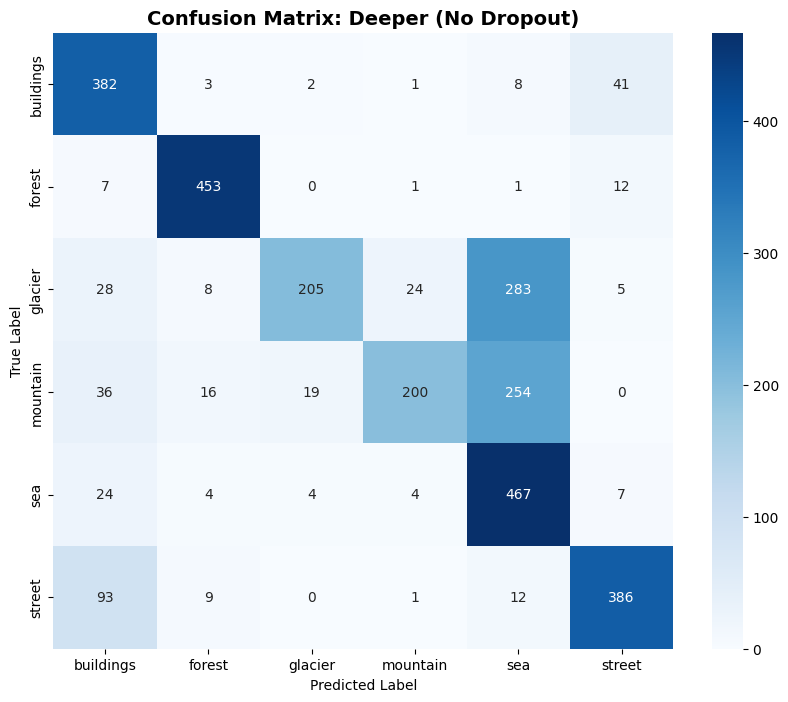

In [ ]:
metrics_no_drop = evaluate_model(model_no_dropout, test_ds, CLASS_NAMES, 'Deeper (No Dropout)')

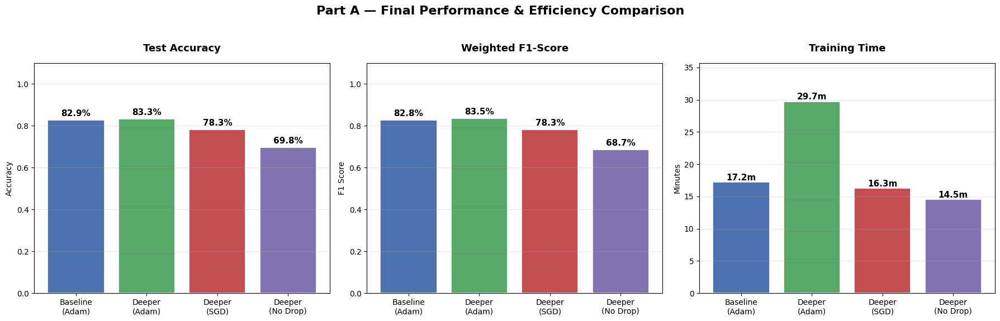

In [ ]:
model_names_summary = ['Baseline\n(Adam)', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'Deeper\n(No Drop)']

acc_summary   = [
    baseline_metrics['accuracy'],
    metrics_deeper['accuracy'],
    metrics_sgd['accuracy'],
    metrics_no_drop['accuracy']
]

f1_summary    = [
    baseline_metrics['f1'],
    metrics_deeper['f1'],
    metrics_sgd['f1'],
    metrics_no_drop['f1']
]

time_summary  = [
    baseline_train_time/60,
    deeper_train_time/60,
    time_sgd/60,
    time_no_dropout/60
]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Part A — Final Performance & Efficiency Comparison', fontsize=16, fontweight='bold')

# Professional color palette
palette_summary = ['#4C72B0', '#55A868', '#C44E52', '#8172B2']

def bar_chart(ax, names, values, title, ylabel, fmt_pct=False):
    bars = ax.bar(names, values, color=palette_summary, edgecolor='white', linewidth=1.2)
    ax.set_title(title, fontsize=13, fontweight='bold', pad=15)
    ax.set_ylabel(ylabel)
    ax.grid(axis='y', alpha=0.3)
    # Add values on top of bars
    for bar, val in zip(bars, values):
        label = f'{val:.1%}' if fmt_pct else f'{val:.1f}m'
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                label, ha='center', va='bottom', fontsize=11, fontweight='bold')

# Plot the three charts
bar_chart(axes[0], model_names_summary, acc_summary,  'Test Accuracy',    'Accuracy', fmt_pct=True)
axes[0].set_ylim([0, 1.1])

bar_chart(axes[1], model_names_summary, f1_summary,   'Weighted F1-Score', 'F1 Score', fmt_pct=True)
axes[1].set_ylim([0, 1.1])

bar_chart(axes[2], model_names_summary, time_summary, 'Training Time',    'Minutes')
axes[2].set_ylim([0, max(time_summary) * 1.2])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('comprehensive_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

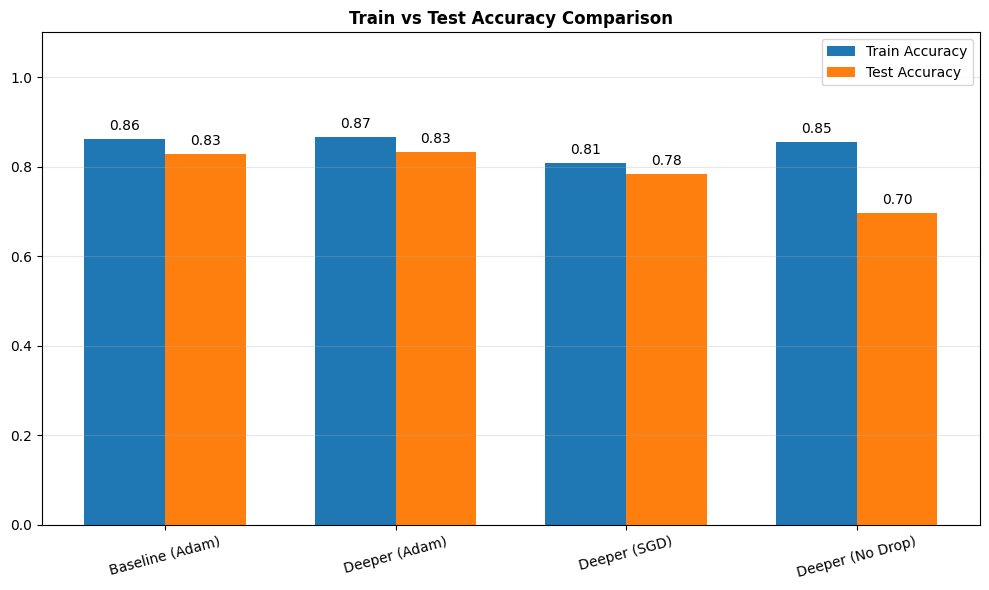

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

model_names = ['Baseline (Adam)', 'Deeper (Adam)', 'Deeper (SGD)', 'Deeper (No Drop)']

# TRAIN accuracy
train_acc = [
    max(history_baseline.history['accuracy']),
    max(history_deeper.history['accuracy']),
    max(hist_sgd.history['accuracy']),
    max(hist_no_dropout.history['accuracy'])
]

# TEST accuracy
test_acc = [
    baseline_metrics['accuracy'],
    metrics_deeper['accuracy'],
    metrics_sgd['accuracy'],
    metrics_no_drop['accuracy']
]

x = np.arange(len(model_names))
width = 0.35

plt.figure(figsize=(10, 6))

plt.bar(x - width/2, train_acc, width, label='Train Accuracy')
plt.bar(x + width/2, test_acc, width, label='Test Accuracy')

plt.title('Train vs Test Accuracy Comparison', fontweight='bold')
plt.xticks(x, model_names, rotation=15)
plt.ylim(0, 1.1)
plt.grid(axis='y', alpha=0.3)
plt.legend()

# value labels
for i in range(len(model_names)):
    plt.text(i - width/2, train_acc[i] + 0.02, f"{train_acc[i]:.2f}", ha='center')
    plt.text(i + width/2, test_acc[i] + 0.02, f"{test_acc[i]:.2f}", ha='center')

plt.tight_layout()
plt.show()

---
## Part B — Transfer Learning with EfficientNetB0


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras import layers
import tensorflow as tf

IMG_SIZE_TL = (224, 224)
BATCH_SIZE_TL = 32

data_augmentation_tl = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomContrast(0.1),
], name='data_augmentation')

In [ ]:
#Training set for Transfer Learning
train_ds_tl = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE_TL,
    batch_size=BATCH_SIZE_TL,
    shuffle=True,
    validation_split=0.2,
    subset='training',
    seed=SEED
)

# Validation set for Transfer Learning
val_ds_tl = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE_TL,
    batch_size=BATCH_SIZE_TL,
    shuffle=False,
    validation_split=0.2,
    subset='validation',
    seed=SEED
)

# Test set for Transfer Learning
test_ds_tl = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred', label_mode='categorical',
    image_size=IMG_SIZE_TL, batch_size=BATCH_SIZE_TL,
    shuffle=False
)

train_ds_tl = train_ds_tl.map(lambda x, y: (tf.cast(x, tf.float32), y))
val_ds_tl   = val_ds_tl.map(lambda x, y: (tf.cast(x, tf.float32), y))
test_ds_tl  = test_ds_tl.map(lambda x, y: (tf.cast(x, tf.float32), y))

print("Transfer Learning data pipelines ready.")
print(f"  Image size     : {IMG_SIZE_TL}")
print(f"  Batch size     : {BATCH_SIZE_TL}")
print(f"  Train batches  : {len(train_ds_tl)}")
print(f"  Val batches    : {len(val_ds_tl)}")
print(f"  Test batches   : {len(test_ds_tl)}")

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.
Transfer Learning data pipelines ready.
  Image size     : (224, 224)
  Batch size     : 32
  Train batches  : 351
  Val batches    : 88
  Test batches   : 94


In [ ]:
base_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)
base_model.trainable = False

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
inputs = layers.Input(shape=(224, 224, 3), name='input_image')

# augmentation FIRST
x = data_augmentation_tl(inputs)

# preprocessing AFTER augmentation
x = preprocess_input(x)

# feature extractor
x = base_model(x, training=False)

# head
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)

x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.4)(x)

x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)

outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = tf.keras.Model(inputs, outputs, name='EfficientNetB0_Transfer')

In [ ]:
tl_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\nModel summary (Phase 1 — Feature Extraction):")
tl_model.summary()
trainable_params = sum(tf.size(w).numpy() for w in tl_model.trainable_variables)
total_params     = sum(tf.size(w).numpy() for w in tl_model.variables)
print(f"\nTrainable params : {trainable_params:,} ({100*trainable_params/total_params:.1f}% of total)")
print(f"Frozen params    : {total_params - trainable_params:,}")


Model summary (Phase 1 — Feature Extraction):


Model: "EfficientNetB0_Transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,416,297 (16.85 MB)

 Trainable params: 364,166 (1.39 MB)

 Non-trainable params: 4,052,131 (15.46 MB)


Trainable params : 364,166 (8.2% of total)
Frozen params    : 4,052,163


In [ ]:
EPOCHS_TL_PHASE1 = 15

callbacks_tl_phase1 = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('tl_phase1_best.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print("Phase 1: Training classification head (frozen EfficientNetB0 base)...")
tl_phase1_start = time.time()

history_tl_phase1 = tl_model.fit(
    train_ds_tl, epochs=EPOCHS_TL_PHASE1,
    validation_data=val_ds_tl,
    callbacks=callbacks_tl_phase1, verbose=1
)

tl_phase1_time = time.time() - tl_phase1_start
print(f"\nPhase 1 complete!")
print(f"  Training time : {tl_phase1_time/60:.2f} minutes")
print(f"  Epochs run    : {len(history_tl_phase1.history['loss'])}")


Phase 1: Training classification head (frozen EfficientNetB0 base)...
Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - accuracy: 0.8079 - loss: 0.5548 - val_accuracy: 0.9152 - val_loss: 0.2302
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - accuracy: 0.8600 - loss: 0.3956 - val_accuracy: 0.9612 - val_loss: 0.1423
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 86s 129ms/step - accuracy: 0.8685 - loss: 0.3699 - val_accuracy: 0.9604 - val_loss: 0.1444
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 114ms/step - accuracy: 0.8774 - loss: 0.3438 - val_accuracy: 0.9661 - val_loss: 0.1403
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - accuracy: 0.8796 - loss: 0.3345 - val_accuracy: 0.9334 - val_loss: 0.1959
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 39s 111ms/step - accuracy: 0.8840 - loss: 0.3176 - val_accuracy: 0.9366 - val_loss: 0.1601
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - accuracy: 0.8878 - loss: 0.3168 - val_accuracy: 0.9387 - val_loss: 0.1911
Epoch 8/15
35

In [ ]:
p1_loss, p1_acc = tl_model.evaluate(test_ds_tl, verbose=0)
print(f"\n[Phase 1 Test Result] Loss: {p1_loss:.4f}, Accuracy: {p1_acc*100:.2f}%")


[Phase 1 Test Result] Loss: 0.2254, Accuracy: 91.53%


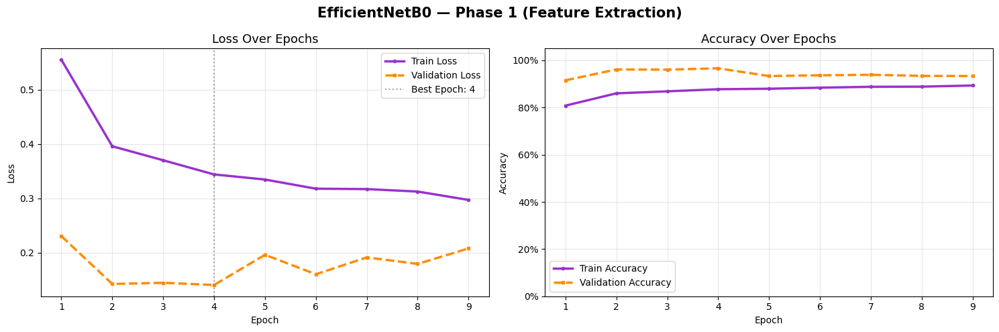

In [ ]:
plot_training_curves(history_tl_phase1,
                     title='EfficientNetB0 — Phase 1 (Feature Extraction)',
                     color_pair=('darkorchid', 'darkorange'))


EVALUATION: EfficientNetB0
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.9510    0.8879    0.9183       437
      forest     0.9958    0.9916    0.9937       474
     glacier     0.8437    0.8590    0.8513       553
    mountain     0.8813    0.8343    0.8571       525
         sea     0.9325    0.9745    0.9530       510
      street     0.9070    0.9541    0.9300       501

    accuracy                         0.9153      3000
   macro avg     0.9185    0.9169    0.9172      3000
weighted avg     0.9156    0.9153    0.9150      3000


Accuracy : 0.9153
Precision: 0.9156
Recall   : 0.9153
F1 Score : 0.9150


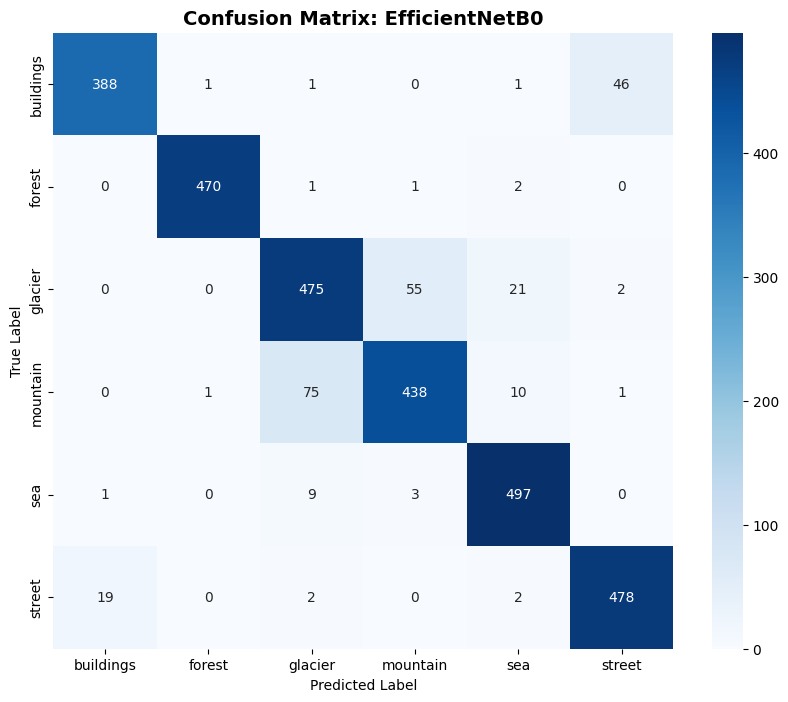

In [ ]:
metrics_tl = evaluate_model(tl_model, test_ds_tl, CLASS_NAMES, 'EfficientNetB0')

In [ ]:
# ─────────────────────────────────────────────────────────────
# Fine-Tuning Strategy:
#   - Unfreeze the top ~50 layers of EfficientNetB0
#   - Keep early layers frozen (they learned universal low-level features)
#   - Use a very low LR (10× lower than Phase 1) to avoid catastrophic
#     forgetting of the pre-trained ImageNet weights
# ─────────────────────────────────────────────────────────────

# Unfreeze the base model
base_model.trainable = True

# Freeze all layers except the last 50
FREEZE_UNTIL = len(base_model.layers) - 50
for layer in base_model.layers[:FREEZE_UNTIL]:
    layer.trainable = False

# Report trainable status
trainable_count = sum(1 for l in base_model.layers if l.trainable)
print(f"EfficientNetB0 total layers    : {len(base_model.layers)}")
print(f"Frozen layers                  : {FREEZE_UNTIL}")
print(f"Fine-tuning layers (unfrozen)  : {trainable_count}")

# Recompile with a much lower learning rate
# Rule of thumb: 10× smaller than Phase 1 LR
tl_model.compile(
    optimizer=Adam(learning_rate=1e-4),   # Low LR to protect pre-trained weights
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

trainable_params = sum(tf.size(w).numpy() for w in tl_model.trainable_variables)
total_params     = sum(tf.size(w).numpy() for w in tl_model.variables)
print(f"\nTrainable params (Phase 2): {trainable_params:,} ({100*trainable_params/total_params:.1f}% of total)")

EfficientNetB0 total layers    : 238
Frozen layers                  : 188
Fine-tuning layers (unfrozen)  : 50

Trainable params (Phase 2): 2,891,030 (65.5% of total)


In [ ]:
EPOCHS_TL_PHASE2 = 18

callbacks_tl_phase2 = [
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
    ModelCheckpoint('tl_phase2_best.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

In [ ]:
print("Phase 2: Fine-tuning top layers of EfficientNetB0...")
tl_phase2_start = time.time()

history_tl_phase2 = tl_model.fit(
    train_ds_tl, epochs=EPOCHS_TL_PHASE2,
    validation_data=val_ds_tl,
    callbacks=callbacks_tl_phase2, verbose=1
)

tl_phase2_time = time.time() - tl_phase2_start
tl_total_time  = tl_phase1_time + tl_phase2_time

print(f"\nPhase 2 complete!")
print(f"  Phase 2 time  : {tl_phase2_time/60:.2f} minutes")
print(f"  Total TL time : {tl_total_time/60:.2f} minutes")
print(f"  Epochs run    : {len(history_tl_phase2.history['loss'])}")

Phase 2: Fine-tuning top layers of EfficientNetB0...
Epoch 1/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 151ms/step - accuracy: 0.8679 - loss: 0.3736 - val_accuracy: 0.9694 - val_loss: 0.1364
Epoch 2/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - accuracy: 0.8923 - loss: 0.2998 - val_accuracy: 0.9768 - val_loss: 0.0936
Epoch 3/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - accuracy: 0.9028 - loss: 0.2716 - val_accuracy: 0.9694 - val_loss: 0.1082
Epoch 4/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 49s 140ms/step - accuracy: 0.9126 - loss: 0.2397 - val_accuracy: 0.9601 - val_loss: 0.1212
Epoch 5/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - accuracy: 0.9222 - loss: 0.2235 - val_accuracy: 0.9751 - val_loss: 0.0921
Epoch 6/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 49s 140ms/step - accuracy: 0.9296 - loss: 0.2044 - val_accuracy: 0.9579 - val_loss: 0.1406
Epoch 7/18
351/351 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - accuracy: 0.9298 - loss: 0.1883 - val_accuracy: 0.9729 - val_loss: 0.1041
Epoch 8/18
351/351 ━━━━━━━━━━━

In [ ]:
p2_loss, p2_acc = tl_model.evaluate(test_ds_tl, verbose=0)
print(f"\n[Phase 2 Test Result] Loss: {p2_loss:.4f}, Accuracy: {p2_acc*100:.2f}%")


[Phase 2 Test Result] Loss: 0.2324, Accuracy: 92.83%


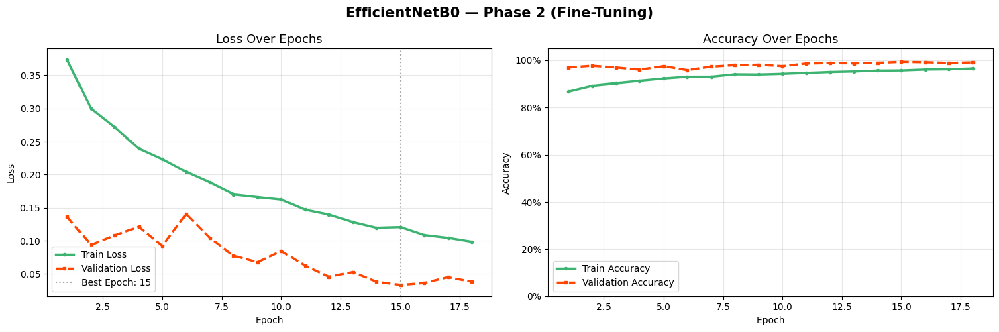

In [ ]:
plot_training_curves(history_tl_phase2,
                     title='EfficientNetB0 — Phase 2 (Fine-Tuning)',
                     color_pair=('mediumseagreen', 'orangered'))

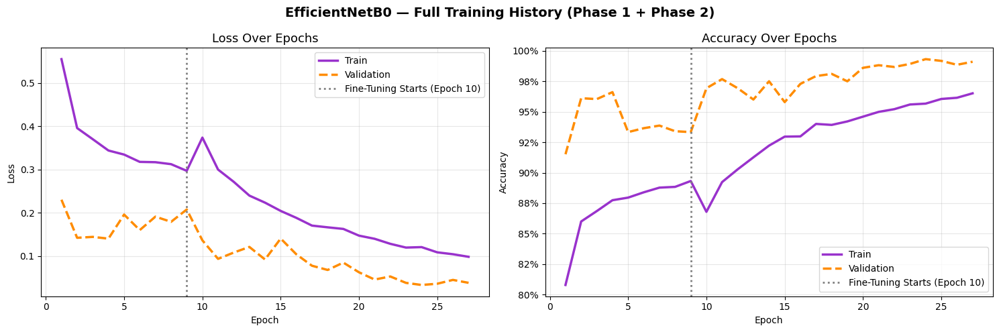

In [ ]:
# ── Combined training history: Phase 1 + Phase 2 ──
acc_combined     = history_tl_phase1.history['accuracy']     + history_tl_phase2.history['accuracy']
val_acc_combined = history_tl_phase1.history['val_accuracy'] + history_tl_phase2.history['val_accuracy']
loss_combined    = history_tl_phase1.history['loss']         + history_tl_phase2.history['loss']
val_loss_combined= history_tl_phase1.history['val_loss']     + history_tl_phase2.history['val_loss']

phase1_end = len(history_tl_phase1.history['accuracy'])
total_epochs = len(acc_combined)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('EfficientNetB0 — Full Training History (Phase 1 + Phase 2)', fontsize=14, fontweight='bold')

for ax, train_vals, val_vals, ylabel, title in [
    (ax1, loss_combined,    val_loss_combined,    'Loss',     'Loss Over Epochs'),
    (ax2, acc_combined,     val_acc_combined,     'Accuracy', 'Accuracy Over Epochs')
]:
    ax.plot(range(1, total_epochs+1), train_vals, 'darkorchid',  lw=2.5, label='Train')
    ax.plot(range(1, total_epochs+1), val_vals,   'darkorange',  lw=2.5, linestyle='--', label='Validation')
    ax.axvline(x=phase1_end, color='gray', linestyle=':', lw=2,
               label=f'Fine-Tuning Starts (Epoch {phase1_end+1})')
    ax.set_title(title, fontsize=13); ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
    if ylabel == 'Accuracy':
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
    ax.legend(fontsize=10); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('tl_combined_history.png', dpi=150, bbox_inches='tight')
plt.show()


EVALUATION: EfficientNetB0 (Fine-Tuned)
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step

Classification Report:
------------------------------------------------------------
              precision    recall  f1-score   support

   buildings     0.9611    0.9039    0.9316       437
      forest     0.9957    0.9873    0.9915       474
     glacier     0.9306    0.8246    0.8744       553
    mountain     0.8504    0.9200    0.8838       525
         sea     0.9363    0.9804    0.9579       510
      street     0.9165    0.9641    0.9397       501

    accuracy                         0.9283      3000
   macro avg     0.9318    0.9300    0.9298      3000
weighted avg     0.9299    0.9283    0.9280      3000


Accuracy : 0.9283
Precision: 0.9299
Recall   : 0.9283
F1 Score : 0.9280


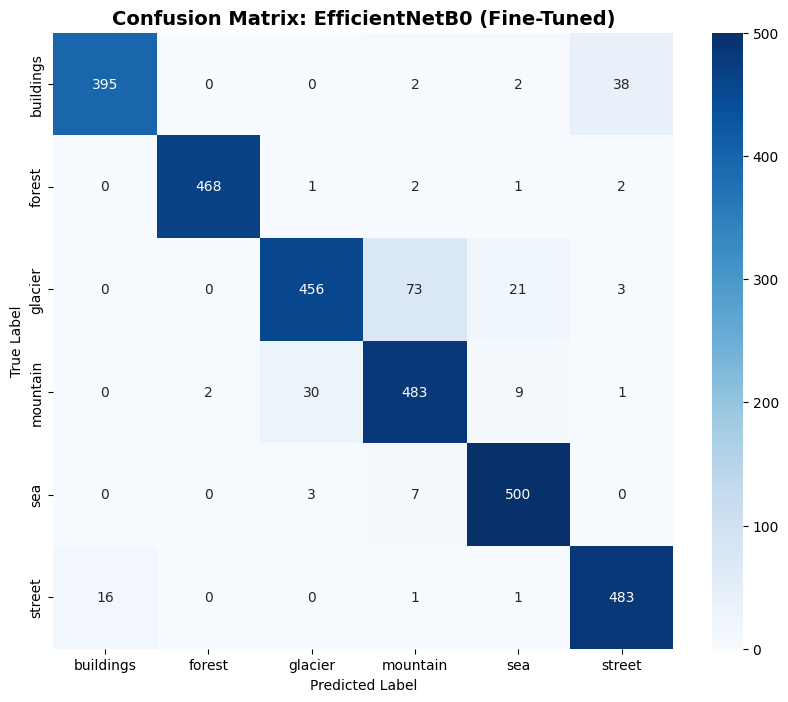

In [ ]:
# Full evaluation of the fine-tuned EfficientNetB0
metrics_tl = evaluate_model(tl_model, test_ds_tl, CLASS_NAMES, 'EfficientNetB0 (Fine-Tuned)')

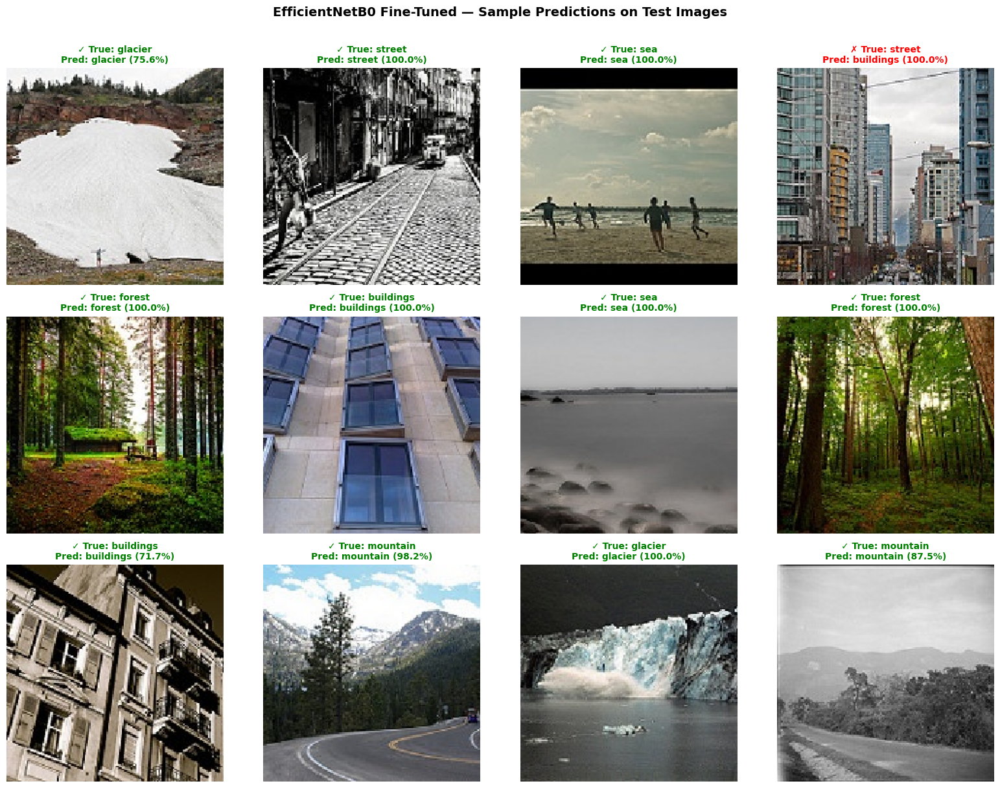

In [ ]:
# Sample predictions
predict_and_visualize(
    tl_model, TEST_DIR, CLASS_NAMES,
    n_samples=12, img_size=IMG_SIZE_TL,
    model_name='EfficientNetB0 Fine-Tuned',
    normalize=False   # EfficientNet handles its own normalization internally
)

In [ ]:
# ── Final Comparison: All Models ──
all_model_names = [
    'Baseline CNN\n(Scratch)',
    'Deeper CNN\n(Scratch)',
    'EfficientNetB0\n(Phase 1)',
    'EfficientNetB0\n(Fine-Tuned)'
]

all_acc  = [
    baseline_metrics['accuracy'],
    metrics_deeper['accuracy'],
    p1_acc,
    metrics_tl['accuracy']
]

all_f1 = [
    baseline_metrics['f1'],
    metrics_deeper['f1'],
    None,
    metrics_tl['f1']
]

all_time = [
    baseline_train_time/60,
    deeper_train_time/60,
    tl_phase1_time/60,
    tl_total_time/60
]

# ---------------------------
# Phase 1 F1 Score
# ---------------------------
y_true_tl = np.concatenate([y.numpy() for _, y in test_ds_tl])

# Convert one-hot labels if needed
if len(y_true_tl.shape) > 1:
    y_true_tl = np.argmax(y_true_tl, axis=1)

y_pred_p1 = np.argmax(
    tl_model.predict(test_ds_tl, verbose=0),
    axis=1
)

_, _, f1_tl_p1, _ = precision_recall_fscore_support(
    y_true_tl,
    y_pred_p1,
    average='weighted',
    zero_division=0
)

all_f1[2] = f1_tl_p1

# ---------------------------
# Final Comparison Table
# ---------------------------
print("\n" + "=" * 70)
print("FINAL COMPARISON — ALL MODELS")
print("=" * 70)

print(f"{'Model':<30} {'Accuracy':>10} {'F1 Score':>10} {'Train Time':>12}")
print("-" * 70)

for name, acc, f1, t in zip(all_model_names, all_acc, all_f1, all_time):
    clean_name = name.replace('\n', ' ')
    print(f"{clean_name:<30} {acc:>10.4f} {f1:>10.4f} {t:>11.2f}m")

print("=" * 70)

print(f"\nBest accuracy : {max(all_acc):.4f} "
      f"({all_model_names[np.argmax(all_acc)].replace(chr(10), ' ')})")

print(f"Best F1 score : {max(all_f1):.4f} "
      f"({all_model_names[np.argmax(all_f1)].replace(chr(10), ' ')})")


FINAL COMPARISON — ALL MODELS
Model                            Accuracy   F1 Score   Train Time
----------------------------------------------------------------------
Baseline CNN (Scratch)             0.8287     0.8281       17.20m
Deeper CNN (Scratch)               0.8333     0.8347       29.74m
EfficientNetB0 (Phase 1)           0.9153     0.9280        7.59m
EfficientNetB0 (Fine-Tuned)        0.9283     0.9280       25.31m

Best accuracy : 0.9283 (EfficientNetB0 (Fine-Tuned))
Best F1 score : 0.9280 (EfficientNetB0 (Phase 1))


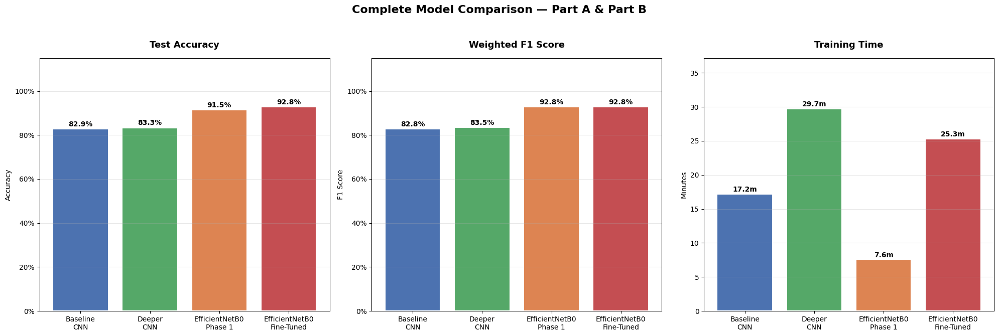

In [ ]:
# ── Final Bar Chart: All Models Compared ──
fig, axes = plt.subplots(1, 3, figsize=(20, 7))
fig.suptitle('Complete Model Comparison — Part A & Part B', fontsize=16, fontweight='bold')

colors = ['#4C72B0', '#55A868', '#DD8452', '#C44E52']
x_labels = ['Baseline\nCNN', 'Deeper\nCNN', 'EfficientNetB0\nPhase 1', 'EfficientNetB0\nFine-Tuned']

for ax, values, title, ylabel, is_pct in [
    (axes[0], all_acc,  'Test Accuracy',     'Accuracy', True),
    (axes[1], all_f1,   'Weighted F1 Score', 'F1 Score', True),
    (axes[2], all_time, 'Training Time',     'Minutes',  False)
]:
    bars = ax.bar(x_labels, values, color=colors, edgecolor='white', linewidth=1.5)
    ax.set_title(title, fontsize=13, fontweight='bold', pad=15)
    ax.set_ylabel(ylabel)
    if is_pct:
        ax.set_ylim([0, 1.15])
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))
    else:
        ax.set_ylim([0, max(values) * 1.25])
    ax.grid(axis='y', alpha=0.3)
    for bar, val in zip(bars, values):
        label = f'{val:.1%}' if is_pct else f'{val:.1f}m'
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + (0.005 if is_pct else 0.1),
                label, ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('final_model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()